## Post Eruptions

In [1]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import xarray as xr
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cmocean
import cartopy.util as util
import matplotlib as mpl
from glob import glob
import pandas as pd
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()
%matplotlib inline
import scipy.stats as stats

mpl.rcParams['figure.figsize'] = [10,4]
mpl.rcParams['figure.dpi'] = 150
mpl.rcParams['savefig.dpi'] = 200

mpl.rcParams['font.size'] = 14
mpl.rcParams['legend.fontsize'] = 'large'
mpl.rcParams['figure.titlesize'] = 'medium'
mpl.rcParams['lines.linewidth']= 2.0
mpl.rcParams['xtick.labelsize']=16
mpl.rcParams['ytick.labelsize']=16

### Loading in files and variables

In [2]:
casePath='/glade/campaign/collections/cmip/CMIP6/timeseries-cmip6/b.e21.BWmaHIST.f19_g17.PMIP4-past1000.002/ocn/proc/tseries/month_1/'
caseName='b.e21.BWmaHIST.f19_g17.PMIP4-past1000.002'

In [3]:
case = casePath + caseName + '.pop.h.' + 'TEMP.*' + '.nc' #sample one 0020-12.nc' 
data = xr.open_mfdataset(case)

In [4]:
data

<xarray.Dataset>
Dimensions:                 (d2: 2, lat_aux_grid: 395, moc_comp: 3, moc_z: 61, nlat: 384, nlon: 320, time: 12000, transport_comp: 5, transport_reg: 2, z_t: 60, z_t_150m: 15, z_w: 60, z_w_bot: 60, z_w_top: 60)
Coordinates:
  * z_t                     (z_t) float32 500.0 1.5e+03 ... 5.125e+05 5.375e+05
  * z_t_150m                (z_t_150m) float32 500.0 1.5e+03 ... 1.45e+04
  * z_w                     (z_w) float32 0.0 1e+03 2e+03 ... 5e+05 5.25e+05
  * z_w_top                 (z_w_top) float32 0.0 1e+03 2e+03 ... 5e+05 5.25e+05
  * z_w_bot                 (z_w_bot) float32 1e+03 2e+03 ... 5.25e+05 5.5e+05
  * lat_aux_grid            (lat_aux_grid) float32 -79.49 -78.95 ... 89.47 90.0
  * moc_z                   (moc_z) float32 0.0 1e+03 2e+03 ... 5.25e+05 5.5e+05
    ULONG                   (nlat, nlon) float64 dask.array<chunksize=(384, 320), meta=np.ndarray>
    ULAT                    (nlat, nlon) float64 dask.array<chunksize=(384, 320), meta=np.ndarray>
    TLONG                   (nlat, nlon) float64 dask.array<chunksize=(384, 320), meta=np.ndarray>
    TLAT                    (nlat, nlon) float64 dask.array<chunksize=(384, 320), meta=np.ndarray>
  * time                    (time) object 0850-02-01 00:00:00 ... 1850-01-01 ...
Dimensions without coordinates: d2, moc_comp, nlat, nlon, transport_comp, transport_reg
Data variables:
    moc_components          (time, moc_comp) |S384 dask.array<chunksize=(600, 3), meta=np.ndarray>
    transport_components    (time, transport_comp) |S384 dask.array<chunksize=(600, 5), meta=np.ndarray>
    transport_regions       (time, transport_reg) |S384 dask.array<chunksize=(600, 2), meta=np.ndarray>
    dz                      (time, z_t) float32 dask.array<chunksize=(600, 60), meta=np.ndarray>
    dzw                     (time, z_w) float32 dask.array<chunksize=(600, 60), meta=np.ndarray>
    KMT                     (time, nlat, nlon) float64 dask.array<chunksize=(600, 384, 320), meta=np.ndarray>
    KMU                     (time, nlat, nlon) float64 dask.array<chunksize=(600, 384, 320), meta=np.ndarray>
    REGION_MASK             (time, nlat, nlon) float64 dask.array<chunksize=(600, 384, 320), meta=np.ndarray>
    UAREA                   (time, nlat, nlon) float64 dask.array<chunksize=(600, 384, 320), meta=np.ndarray>
    TAREA                   (time, nlat, nlon) float64 dask.array<chunksize=(600, 384, 320), meta=np.ndarray>
    HU                      (time, nlat, nlon) float64 dask.array<chunksize=(600, 384, 320), meta=np.ndarray>
    HT                      (time, nlat, nlon) float64 dask.array<chunksize=(600, 384, 320), meta=np.ndarray>
    DXU                     (time, nlat, nlon) float64 dask.array<chunksize=(600, 384, 320), meta=np.ndarray>
    DYU                     (time, nlat, nlon) float64 dask.array<chunksize=(600, 384, 320), meta=np.ndarray>
    DXT                     (time, nlat, nlon) float64 dask.array<chunksize=(600, 384, 320), meta=np.ndarray>
    DYT                     (time, nlat, nlon) float64 dask.array<chunksize=(600, 384, 320), meta=np.ndarray>
    HTN                     (time, nlat, nlon) float64 dask.array<chunksize=(600, 384, 320), meta=np.ndarray>
    HTE                     (time, nlat, nlon) float64 dask.array<chunksize=(600, 384, 320), meta=np.ndarray>
    HUS                     (time, nlat, nlon) float64 dask.array<chunksize=(600, 384, 320), meta=np.ndarray>
    HUW                     (time, nlat, nlon) float64 dask.array<chunksize=(600, 384, 320), meta=np.ndarray>
    ANGLE                   (time, nlat, nlon) float64 dask.array<chunksize=(600, 384, 320), meta=np.ndarray>
    ANGLET                  (time, nlat, nlon) float64 dask.array<chunksize=(600, 384, 320), meta=np.ndarray>
    days_in_norm_year       (time) timedelta64[ns] 365 days ... 365 days
    grav                    (time) float64 980.6 980.6 980.6 ... 980.6 980.6
    omega                   (time) float64 7.292e-05 7.292e-05 ... 7.292e-05
    radius                  (

- The code below creates a seasonal climatology (monthly means) from 1000 to 1030 as a basis for comparison

In [5]:
monthly_data= {}; months = ['jan','feb','mar','apr','may','jun','jul','aug','sept','oct','nov','dec'] #defining months
month_ind =(1000-850)*12 ;#want to start at the first month of year 1000
for month in months:
    print(month)
    current_month_data = np.zeros([30,384,320]) ; current_month_data[:] == np.nan #30 years for every latitude and longitude
    year = 0
    for i in range(0,len(data['time'][:360])+1,12 ): #defining years, 360 is 30 x 12
        try:
            current_month_data[year,:,:] =data['TEMP'][:,0,:,:][month_ind+i,:,:]
        except:
            print(' ')
    
        year+=1
    month_ind +=1
    monthly_data[month] = np.mean(current_month_data, axis = 0)

jan
 
feb
 
mar
 
apr
 
may
 
jun
 
jul
 
aug
 
sept
 
oct
 
nov
 
dec
 


In [6]:
monthlydata=data.sel(time=slice('1000-01-01 00:00:00','1030-12-31 00:00:00')).groupby('time.month').mean(dim='time')

/glade/u/ssg/ch/usr/jupyterhub/envs/npl-3.7.9/dav/lib/python3.7/site-packages/xarray/core/indexing.py:1369: PerformanceWarning: Slicing is producing a large chunk. To accept the large
chunk and silence this warning, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': False}):
    ...     array[indexer]

To avoid creating the large chunks, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': True}):
    ...     array[indexer]
  return self.array[key]
/glade/u/ssg/ch/usr/jupyterhub/envs/npl-3.7.9/dav/lib/python3.7/site-packages/xarray/core/indexing.py:1369: PerformanceWarning: Slicing is producing a large chunk. To accept the large
chunk and silence this warning, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': False}):
    ...     array[indexer]

To avoid creating the large chunks, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': True}):
    ...     array[inde

In [7]:
def pop_add_cyclic(data,TLAT,TLONG): 
    nj = TLAT.shape[0] # size of POP grid
    ni = TLONG.shape[1]
    xL = int(ni/2 - 1)
    xR = int(xL + ni)
    tlon = TLONG
    tlat = TLAT
    tlon = np.where(np.greater_equal(tlon, min(tlon[:,0])), tlon-360., tlon) #make monotoncially increasing
    lon  = np.concatenate((tlon, tlon + 360.), 1) # concatenate to make larger array
    lon = lon[:, xL:xR] #restrict to middle rane
    if ni == 320: # this is the x1 POP grid
        lon[367:-3, 0] = lon[367:-3, 0] + 360.        
    lon = lon - 360.
    lon = np.hstack((lon, lon[:, 0:1] + 360.)) # add in cyclic point
    if ni == 320:
        lon[367:, -1] = lon[367:, -1] - 360.
    #-- trick cartopy into doing the right thing:
    #   it gets confused when the cyclic coords are identical
    lon[:, 0] = lon[:, 0] - 1e-8
    #-- periodicity
    lat = np.concatenate((tlat, tlat), 1)
    lat = lat[:, xL:xR]
    lat = np.hstack((lat, lat[:,0:1]))
    lon_dim = 1 #ds[v].dims.index('nlon')
    field = data
    field = np.concatenate((field, field), 1)
    field = field[:, xL:xR]
    field = np.concatenate((field, field[:, 0:1]), lon_dim)
    
    return field, lat, lon

### Get the lat and lon locations for the El Nino region: 

In [8]:
data['TLAT'][206,50].values

array(5.18019218)

In [9]:
data['TLAT'][167,50].values

array(-5.2090898)

In [10]:
abs(data['TLONG'][50,203].values-360)

171.06249474233516

In [11]:
abs(data['TLONG'][50,248].values-360)

120.43749333356618

### Samalas 1257: Post Eruption years

- The code below creates post eruption monthly means from 1257 to 1260 (the 3 years after the Samalas Eruption)

In [12]:
samalas_post_1yr = data.sel(time=slice('1257-07-01 00:00:00','1258-07-01 00:00:00')).groupby('time.month').mean(dim='time')
samalas_post_2yr = data.sel(time=slice('1258-07-01 00:00:00','1259-07-01 00:00:00')).groupby('time.month').mean(dim='time')
samalas_post_3yr = data.sel(time=slice('1259-07-01 00:00:00','1260-07-01 00:00:00')).groupby('time.month').mean(dim='time')

#### Year 1

In [13]:
samalas_post_1yr

<xarray.Dataset>
Dimensions:                 (lat_aux_grid: 395, moc_z: 61, month: 12, nlat: 384, nlon: 320, z_t: 60, z_t_150m: 15, z_w: 60, z_w_bot: 60, z_w_top: 60)
Coordinates:
  * z_t                     (z_t) float32 500.0 1.5e+03 ... 5.125e+05 5.375e+05
  * z_t_150m                (z_t_150m) float32 500.0 1.5e+03 ... 1.45e+04
  * z_w                     (z_w) float32 0.0 1e+03 2e+03 ... 5e+05 5.25e+05
  * z_w_top                 (z_w_top) float32 0.0 1e+03 2e+03 ... 5e+05 5.25e+05
  * z_w_bot                 (z_w_bot) float32 1e+03 2e+03 ... 5.25e+05 5.5e+05
  * lat_aux_grid            (lat_aux_grid) float32 -79.49 -78.95 ... 89.47 90.0
  * moc_z                   (moc_z) float32 0.0 1e+03 2e+03 ... 5.25e+05 5.5e+05
    ULONG                   (nlat, nlon) float64 dask.array<chunksize=(384, 320), meta=np.ndarray>
    ULAT                    (nlat, nlon) float64 dask.array<chunksize=(384, 320), meta=np.ndarray>
    TLONG                   (nlat, nlon) float64 dask.array<chunksize=(384, 320), meta=np.ndarray>
    TLAT                    (nlat, nlon) float64 dask.array<chunksize=(384, 320), meta=np.ndarray>
  * month                   (month) int64 1 2 3 4 5 6 7 8 9 10 11 12
Dimensions without coordinates: nlat, nlon
Data variables:
    dz                      (month, z_t) float32 dask.array<chunksize=(1, 60), meta=np.ndarray>
    dzw                     (month, z_w) float32 dask.array<chunksize=(1, 60), meta=np.ndarray>
    KMT                     (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    KMU                     (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    REGION_MASK             (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    UAREA                   (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    TAREA                   (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    HU                      (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    HT                      (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    DXU                     (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    DYU                     (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    DXT                     (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    DYT                     (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    HTN                     (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    HTE                     (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    HUS                     (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    HUW                     (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    ANGLE                   (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    ANGLET                  (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    days_in_norm_year       (month) timedelta64[ns] 365 days ... 365 days
    grav                    (month) float64 980.6 980.6 980.6 ... 980.6 980.6
    omega                   (month) float64 7.292e-05 7.292e-05 ... 7.292e-05
    radius                  (month) float64 6.371e+08 6.371e+08 ... 6.371e+08
    cp_sw                   (month) float64 3.996e+07 3.996e+07 ... 3.996e+07
    sound                   (month) float64 1.5e+05 1.5e+05 ... 1.5e+05 1.5e+05
    vonkar                  (month) float64 0.4 0.4 0.4 0.4 ... 0.4 0.4 0.4 0.4
    cp_air                  (month) float64 1.005e+03 1.005e+03 ... 1.005e+03
    rho_air                 (month) float64 1.292 1.292 1.292 ... 1.292 1.2

In [14]:
samalas_post_1yr_anomaly = samalas_post_1yr-monthlydata
samalas_post_1yr_anomaly

<xarray.Dataset>
Dimensions:                 (lat_aux_grid: 395, moc_z: 61, month: 12, nlat: 384, nlon: 320, z_t: 60, z_t_150m: 15, z_w: 60, z_w_bot: 60, z_w_top: 60)
Coordinates:
  * z_t                     (z_t) float32 500.0 1.5e+03 ... 5.125e+05 5.375e+05
  * z_t_150m                (z_t_150m) float32 500.0 1.5e+03 ... 1.45e+04
  * z_w                     (z_w) float32 0.0 1e+03 2e+03 ... 5e+05 5.25e+05
  * z_w_top                 (z_w_top) float32 0.0 1e+03 2e+03 ... 5e+05 5.25e+05
  * z_w_bot                 (z_w_bot) float32 1e+03 2e+03 ... 5.25e+05 5.5e+05
  * lat_aux_grid            (lat_aux_grid) float32 -79.49 -78.95 ... 89.47 90.0
  * moc_z                   (moc_z) float32 0.0 1e+03 2e+03 ... 5.25e+05 5.5e+05
    ULONG                   (nlat, nlon) float64 dask.array<chunksize=(384, 320), meta=np.ndarray>
    ULAT                    (nlat, nlon) float64 dask.array<chunksize=(384, 320), meta=np.ndarray>
    TLONG                   (nlat, nlon) float64 dask.array<chunksize=(384, 320), meta=np.ndarray>
    TLAT                    (nlat, nlon) float64 dask.array<chunksize=(384, 320), meta=np.ndarray>
  * month                   (month) int64 1 2 3 4 5 6 7 8 9 10 11 12
Dimensions without coordinates: nlat, nlon
Data variables:
    dz                      (month, z_t) float32 dask.array<chunksize=(1, 60), meta=np.ndarray>
    dzw                     (month, z_w) float32 dask.array<chunksize=(1, 60), meta=np.ndarray>
    KMT                     (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    KMU                     (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    REGION_MASK             (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    UAREA                   (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    TAREA                   (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    HU                      (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    HT                      (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    DXU                     (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    DYU                     (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    DXT                     (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    DYT                     (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    HTN                     (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    HTE                     (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    HUS                     (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    HUW                     (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    ANGLE                   (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    ANGLET                  (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    days_in_norm_year       (month) timedelta64[ns] 00:00:00 ... 00:00:00
    grav                    (month) float64 -4.547e-13 -4.547e-13 ... -4.547e-13
    omega                   (month) float64 1.355e-20 1.355e-20 ... 1.355e-20
    radius                  (month) float64 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    cp_sw                   (month) float64 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    sound                   (month) float64 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    vonkar                  (month) float64 -1.11e-16 -1.11e-16 ... -1.11e-16
    cp_air                  (month) float64 1.137e-13 1.137e-13 ... 1.137e-13
    rho_air                 (month) float64 -6.661e-16 -6.661e-16 ... 

In [15]:
from scipy.ndimage import uniform_filter1d

def rolling_mean(a, W, axis=-1):
    # a : Input ndarray
    # W : Window size
    # axis : Axis along which we will apply rolling/sliding mean
    hW = W//2
    L = a.shape[axis]-W+1   
    indexer = [slice(None) for _ in range(a.ndim)]
    indexer[axis] = slice(hW,hW+L)
    return uniform_filter1d(a,W,axis=axis)[tuple(indexer)]

def ENSO_area_mean(var):  
    # assumes 2D field as var input
    # make sure masking is correct, otherwise we get nans
    var = np.ma.masked_invalid(var)
    # resulting variable should have dimensions of depth and time (x)
    ave = np.zeros(var.shape[0])
    # loop over time
    for t in np.arange(var.shape[0]):
        ave[t] = np.ma.average(var[t,167:206,203:248])
    return ave

In [16]:
samalas_rm=rolling_mean(samalas_post_1yr_anomaly['TEMP'][:,0,:,:],5,axis=0)

/glade/u/ssg/ch/usr/jupyterhub/envs/npl-3.7.9/dav/lib/python3.7/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


In [17]:
ENSO_area_mean(samalas_rm)

array([-1.97072469, -1.85468124, -1.51530045, -1.0235595 , -0.72940705,
       -0.7322989 , -0.7608091 , -1.05928291])

In [18]:
plot_data,new_lats,new_lons = pop_add_cyclic(samalas_rm[0],data['TLAT'],data['TLONG'])

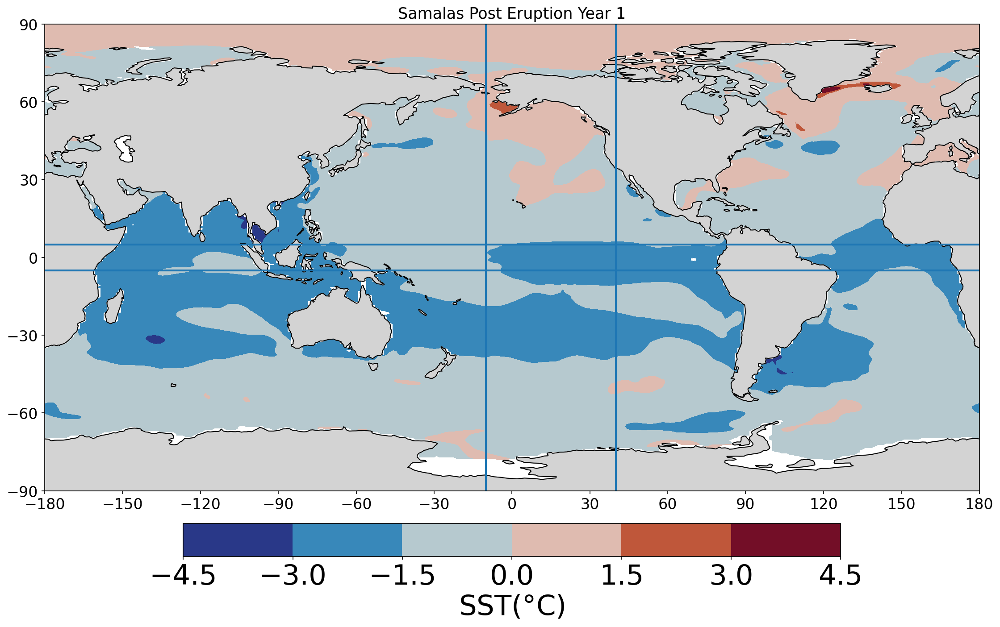

In [25]:
projection=ccrs.PlateCarree(central_longitude = -160)
fig,ax= plt.subplots(figsize =(18,13),subplot_kw=dict(projection=projection))

ax.add_feature(cfeature.LAND, color = 'lightgray')
ax.add_feature(cfeature.COASTLINE)
ax.set_global()


p = plt.contourf(new_lons,new_lats, plot_data,
                transform=ccrs.PlateCarree(),cmap= 'cmo.balance',zorder=-1) #'cmo.balance' or 'coolwarm'
ax.set_yticks([-90, -60, -30, 0, 30, 60, 90], crs=projection)
ax.set_xticks([-180, -150, -120, -90, -60, -30, 0, 30, 60, 90, 120, 150, 180])
plt.axhline(y=5)
plt.axhline(y=-5)
plt.axvline(x=-10)
plt.axvline(x=40)
plt.title('Samalas Post Eruption Year 1')
cbar = plt.colorbar(p, orientation='horizontal', pad=0.05, fraction=0.05,ax=ax)
cbar.ax.tick_params(labelsize=30)
cbar.set_label('SST' + "($\degree$C)", size = 30)

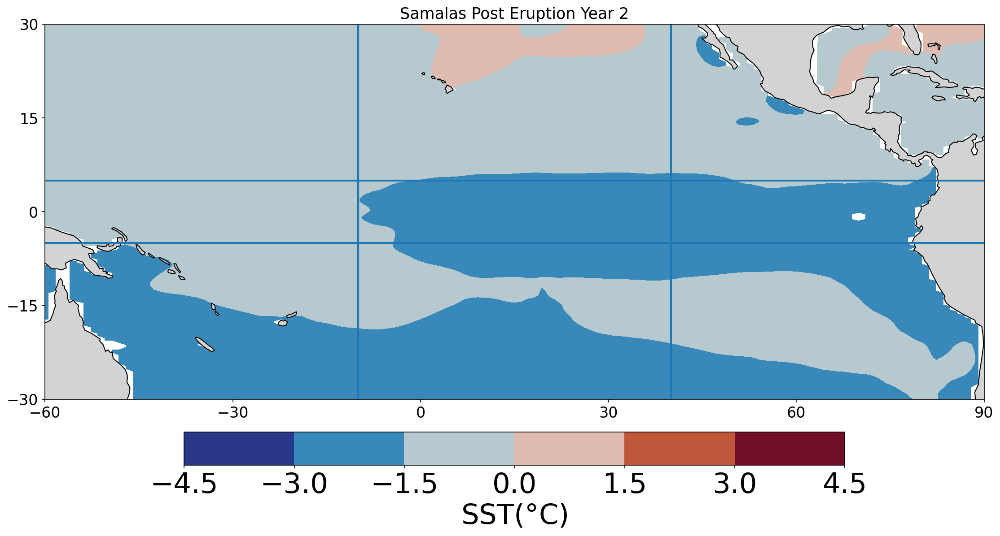

In [41]:
projection=ccrs.PlateCarree(central_longitude = -160)
fig,ax= plt.subplots(figsize =(18,13),subplot_kw=dict(projection=projection))

ax.add_feature(cfeature.LAND, color = 'lightgray')
ax.add_feature(cfeature.COASTLINE)
ax.set_global()


p = plt.contourf(new_lons,new_lats, plot_data,
                transform=ccrs.PlateCarree(),cmap= 'cmo.balance',zorder=-1) #'cmo.balance' or 'coolwarm'
ax.set_yticks([-90, -60, -30, -15, 0, 15, 30, 60, 90], crs=projection)
ax.set_xticks([-90, -60, -30, 0, 30, 60, 90])
plt.axhline(y=5)
plt.axhline(y=-5)
plt.axvline(x=-10)
plt.axvline(x=40)
plt.title('Samalas Post Eruption Year 1')
cbar = plt.colorbar(p, orientation='horizontal', pad=0.05, fraction=0.05,ax=ax)
cbar.ax.tick_params(labelsize=30)
cbar.set_label('SST' + "($\degree$C)", size = 30)
ax.set_extent([-60, 90, -30, 30], projection)

#### Year 2

In [47]:
samalas_post_2yr_anomaly = samalas_post_2yr-monthlydata
samalas_post_2yr_anomaly

<xarray.Dataset>
Dimensions:                 (lat_aux_grid: 395, moc_z: 61, month: 12, nlat: 384, nlon: 320, z_t: 60, z_t_150m: 15, z_w: 60, z_w_bot: 60, z_w_top: 60)
Coordinates:
  * z_t                     (z_t) float32 500.0 1.5e+03 ... 5.125e+05 5.375e+05
  * z_t_150m                (z_t_150m) float32 500.0 1.5e+03 ... 1.45e+04
  * z_w                     (z_w) float32 0.0 1e+03 2e+03 ... 5e+05 5.25e+05
  * z_w_top                 (z_w_top) float32 0.0 1e+03 2e+03 ... 5e+05 5.25e+05
  * z_w_bot                 (z_w_bot) float32 1e+03 2e+03 ... 5.25e+05 5.5e+05
  * lat_aux_grid            (lat_aux_grid) float32 -79.49 -78.95 ... 89.47 90.0
  * moc_z                   (moc_z) float32 0.0 1e+03 2e+03 ... 5.25e+05 5.5e+05
    ULONG                   (nlat, nlon) float64 dask.array<chunksize=(384, 320), meta=np.ndarray>
    ULAT                    (nlat, nlon) float64 dask.array<chunksize=(384, 320), meta=np.ndarray>
    TLONG                   (nlat, nlon) float64 dask.array<chunksize=(384, 320), meta=np.ndarray>
    TLAT                    (nlat, nlon) float64 dask.array<chunksize=(384, 320), meta=np.ndarray>
  * month                   (month) int64 1 2 3 4 5 6 7 8 9 10 11 12
Dimensions without coordinates: nlat, nlon
Data variables:
    dz                      (month, z_t) float32 dask.array<chunksize=(1, 60), meta=np.ndarray>
    dzw                     (month, z_w) float32 dask.array<chunksize=(1, 60), meta=np.ndarray>
    KMT                     (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    KMU                     (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    REGION_MASK             (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    UAREA                   (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    TAREA                   (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    HU                      (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    HT                      (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    DXU                     (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    DYU                     (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    DXT                     (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    DYT                     (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    HTN                     (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    HTE                     (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    HUS                     (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    HUW                     (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    ANGLE                   (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    ANGLET                  (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    days_in_norm_year       (month) timedelta64[ns] 00:00:00 ... 00:00:00
    grav                    (month) float64 -4.547e-13 -4.547e-13 ... -4.547e-13
    omega                   (month) float64 1.355e-20 1.355e-20 ... 1.355e-20
    radius                  (month) float64 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    cp_sw                   (month) float64 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    sound                   (month) float64 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    vonkar                  (month) float64 -1.11e-16 -1.11e-16 ... -1.11e-16
    cp_air                  (month) float64 1.137e-13 1.137e-13 ... 1.137e-13
    rho_air                 (month) float64 -6.661e-16 -6.661e-16 ... 

In [48]:
from scipy.ndimage import uniform_filter1d

def rolling_mean(a, W, axis=-1):
    # a : Input ndarray
    # W : Window size
    # axis : Axis along which we will apply rolling/sliding mean
    hW = W//2
    L = a.shape[axis]-W+1   
    indexer = [slice(None) for _ in range(a.ndim)]
    indexer[axis] = slice(hW,hW+L)
    return uniform_filter1d(a,W,axis=axis)[tuple(indexer)]

def ENSO_area_mean(var):  
    # assumes 2D field as var input
    # make sure masking is correct, otherwise we get nans
    var = np.ma.masked_invalid(var)
    # resulting variable should have dimensions of depth and time (x)
    ave = np.zeros(var.shape[0])
    # loop over time
    for t in np.arange(var.shape[0]):
        ave[t] = np.ma.average(var[t,167:206,203:248])
    return ave

In [49]:
samalas_post_2yr_rm=rolling_mean(samalas_post_2yr_anomaly['TEMP'][:,0,:,:],5,axis=0)

/glade/u/ssg/ch/usr/jupyterhub/envs/npl-3.7.9/dav/lib/python3.7/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


In [50]:
ENSO_area_mean(samalas_post_2yr_rm)

array([-0.24484644, -0.57402465, -0.92574327, -1.06406104, -0.94084201,
       -0.65221382, -0.30334699, -0.05186637])

In [51]:
plot_data,new_lats,new_lons = pop_add_cyclic(samalas_post_2yr_rm[0],data['TLAT'],data['TLONG'])

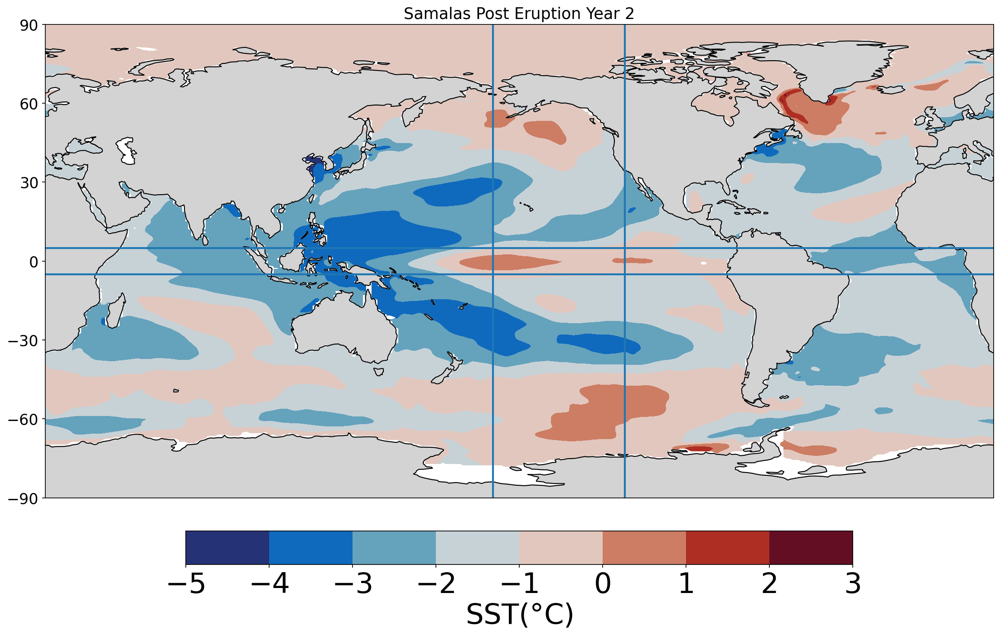

In [19]:
projection=ccrs.PlateCarree(central_longitude = -160)
fig,ax= plt.subplots(figsize =(18,13),subplot_kw=dict(projection=projection))

ax.add_feature(cfeature.LAND, color = 'lightgray')
ax.add_feature(cfeature.COASTLINE)
ax.set_global()


p = plt.contourf(new_lons,new_lats, plot_data,
                transform=ccrs.PlateCarree(),cmap= 'cmo.balance',zorder=-1) #'cmo.balance' or 'coolwarm'
ax.set_yticks([-90, -60, -30, 0, 30, 60, 90], crs=projection)
plt.axhline(y=5)
plt.axhline(y=-5)
plt.axvline(x=-10)
plt.axvline(x=40)
plt.title('Samalas Post Eruption Year 2')
cbar = plt.colorbar(p, orientation='horizontal', pad=0.05, fraction=0.05,ax=ax)
cbar.ax.tick_params(labelsize=30)
cbar.set_label('SST' + "($\degree$C)", size = 30)

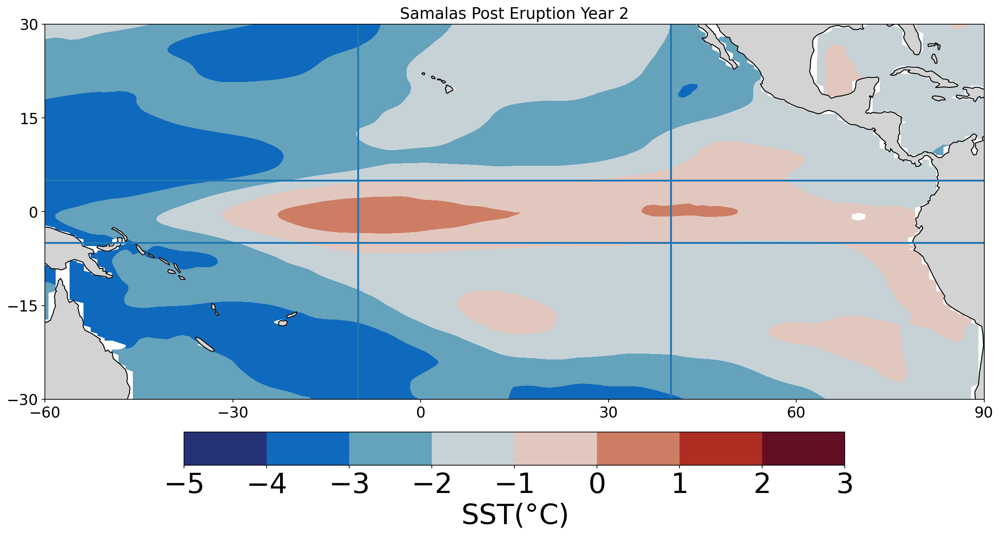

In [52]:
projection=ccrs.PlateCarree(central_longitude = -160)
fig,ax= plt.subplots(figsize =(18,13),subplot_kw=dict(projection=projection))

ax.add_feature(cfeature.LAND, color = 'lightgray')
ax.add_feature(cfeature.COASTLINE)
ax.set_global()


p = plt.contourf(new_lons,new_lats, plot_data,
                transform=ccrs.PlateCarree(),cmap= 'cmo.balance',zorder=-1) #'cmo.balance' or 'coolwarm'
ax.set_yticks([-90, -60, -30, -15, 0, 15, 30, 60, 90], crs=projection)
ax.set_xticks([-90, -60, -30, 0, 30, 60, 90])
plt.axhline(y=5)
plt.axhline(y=-5)
plt.axvline(x=-10)
plt.axvline(x=40)
plt.title('Samalas Post Eruption Year 2')
cbar = plt.colorbar(p, orientation='horizontal', pad=0.05, fraction=0.05,ax=ax)
cbar.ax.tick_params(labelsize=30)
cbar.set_label('SST' + "($\degree$C)", size = 30)
ax.set_extent([-60, 90, -30, 30], projection)

#### Year 3

In [26]:
samalas_post_3yr_anomaly = samalas_post_3yr-monthlydata
samalas_post_3yr_anomaly

<xarray.Dataset>
Dimensions:                 (lat_aux_grid: 395, moc_z: 61, month: 12, nlat: 384, nlon: 320, z_t: 60, z_t_150m: 15, z_w: 60, z_w_bot: 60, z_w_top: 60)
Coordinates:
  * z_t                     (z_t) float32 500.0 1.5e+03 ... 5.125e+05 5.375e+05
  * z_t_150m                (z_t_150m) float32 500.0 1.5e+03 ... 1.45e+04
  * z_w                     (z_w) float32 0.0 1e+03 2e+03 ... 5e+05 5.25e+05
  * z_w_top                 (z_w_top) float32 0.0 1e+03 2e+03 ... 5e+05 5.25e+05
  * z_w_bot                 (z_w_bot) float32 1e+03 2e+03 ... 5.25e+05 5.5e+05
  * lat_aux_grid            (lat_aux_grid) float32 -79.49 -78.95 ... 89.47 90.0
  * moc_z                   (moc_z) float32 0.0 1e+03 2e+03 ... 5.25e+05 5.5e+05
    ULONG                   (nlat, nlon) float64 dask.array<chunksize=(384, 320), meta=np.ndarray>
    ULAT                    (nlat, nlon) float64 dask.array<chunksize=(384, 320), meta=np.ndarray>
    TLONG                   (nlat, nlon) float64 dask.array<chunksize=(384, 320), meta=np.ndarray>
    TLAT                    (nlat, nlon) float64 dask.array<chunksize=(384, 320), meta=np.ndarray>
  * month                   (month) int64 1 2 3 4 5 6 7 8 9 10 11 12
Dimensions without coordinates: nlat, nlon
Data variables:
    dz                      (month, z_t) float32 dask.array<chunksize=(1, 60), meta=np.ndarray>
    dzw                     (month, z_w) float32 dask.array<chunksize=(1, 60), meta=np.ndarray>
    KMT                     (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    KMU                     (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    REGION_MASK             (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    UAREA                   (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    TAREA                   (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    HU                      (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    HT                      (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    DXU                     (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    DYU                     (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    DXT                     (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    DYT                     (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    HTN                     (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    HTE                     (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    HUS                     (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    HUW                     (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    ANGLE                   (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    ANGLET                  (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    days_in_norm_year       (month) timedelta64[ns] 00:00:00 ... 00:00:00
    grav                    (month) float64 -4.547e-13 -4.547e-13 ... -4.547e-13
    omega                   (month) float64 1.355e-20 1.355e-20 ... 1.355e-20
    radius                  (month) float64 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    cp_sw                   (month) float64 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    sound                   (month) float64 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    vonkar                  (month) float64 -1.11e-16 -1.11e-16 ... -1.11e-16
    cp_air                  (month) float64 1.137e-13 1.137e-13 ... 1.137e-13
    rho_air                 (month) float64 -6.661e-16 -6.661e-16 ... 

In [27]:
from scipy.ndimage import uniform_filter1d

def rolling_mean(a, W, axis=-1):
    # a : Input ndarray
    # W : Window size
    # axis : Axis along which we will apply rolling/sliding mean
    hW = W//2
    L = a.shape[axis]-W+1   
    indexer = [slice(None) for _ in range(a.ndim)]
    indexer[axis] = slice(hW,hW+L)
    return uniform_filter1d(a,W,axis=axis)[tuple(indexer)]

def ENSO_area_mean(var):  
    # assumes 2D field as var input
    # make sure masking is correct, otherwise we get nans
    var = np.ma.masked_invalid(var)
    # resulting variable should have dimensions of depth and time (x)
    ave = np.zeros(var.shape[0])
    # loop over time
    for t in np.arange(var.shape[0]):
        ave[t] = np.ma.average(var[t,167:206,203:248])
    return ave

In [28]:
samalas_post_3yr_rm=rolling_mean(samalas_post_3yr_anomaly['TEMP'][:,0,:,:],5,axis=0)

/glade/u/ssg/ch/usr/jupyterhub/envs/npl-3.7.9/dav/lib/python3.7/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


In [29]:
ENSO_area_mean(samalas_post_3yr_rm)

array([-3.12427606, -3.08765831, -2.86439025, -2.63556162, -2.4944194 ,
       -2.38226384, -2.34833623, -2.46773782])

In [30]:
plot_data,new_lats,new_lons = pop_add_cyclic(samalas_post_3yr_rm[0],data['TLAT'],data['TLONG'])

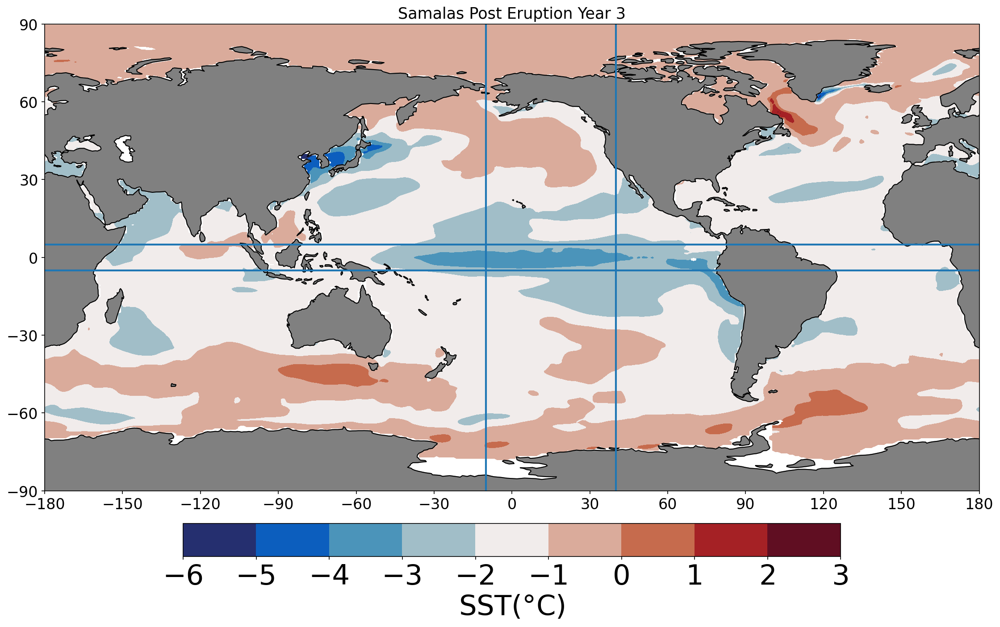

In [32]:
projection=ccrs.PlateCarree(central_longitude = -160)
fig,ax= plt.subplots(figsize =(18,13),subplot_kw=dict(projection=projection))

ax.add_feature(cfeature.LAND, color = 'gray')
ax.add_feature(cfeature.COASTLINE)
ax.set_global()


p = plt.contourf(new_lons,new_lats, plot_data,
                transform=ccrs.PlateCarree(),cmap= 'cmo.balance',zorder=-1) #'cmo.balance' or 'coolwarm'
ax.set_yticks([-90, -60, -30, 0, 30, 60, 90], crs=projection)
ax.set_xticks([-180, -150, -120, -90, -60, -30, 0, 30, 60, 90, 120, 150, 180])
plt.axhline(y=5)
plt.axhline(y=-5)
plt.axvline(x=-10)
plt.axvline(x=40)
plt.title('Samalas Post Eruption Year 3')
cbar = plt.colorbar(p, orientation='horizontal', pad=0.05, fraction=0.05,ax=ax)
cbar.ax.tick_params(labelsize=30)
cbar.set_label('SST' + "($\degree$C)", size = 30)

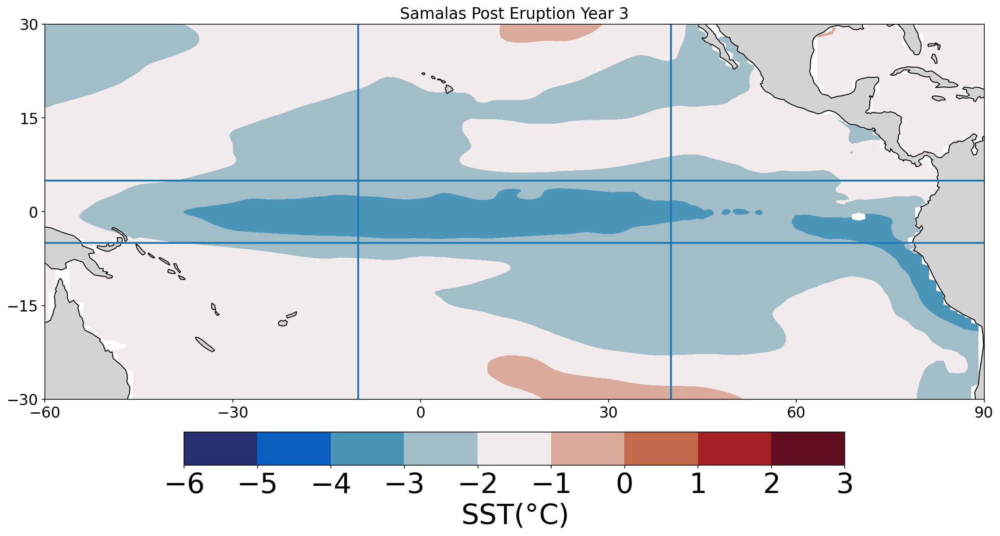

In [31]:
projection=ccrs.PlateCarree(central_longitude = -160)
fig,ax= plt.subplots(figsize =(18,13),subplot_kw=dict(projection=projection))

ax.add_feature(cfeature.LAND, color = 'lightgray')
ax.add_feature(cfeature.COASTLINE)
ax.set_global()


p = plt.contourf(new_lons,new_lats, plot_data,
                transform=ccrs.PlateCarree(),cmap= 'cmo.balance',zorder=-1) #'cmo.balance' or 'coolwarm'
ax.set_yticks([-90, -60, -30, -15, 0, 15, 30, 60, 90], crs=projection)
ax.set_xticks([-90, -60, -30, 0, 30, 60, 90])
plt.axhline(y=5)
plt.axhline(y=-5)
plt.axvline(x=-10)
plt.axvline(x=40)
plt.title('Samalas Post Eruption Year 3')
cbar = plt.colorbar(p, orientation='horizontal', pad=0.05, fraction=0.05,ax=ax)
cbar.ax.tick_params(labelsize=30)
cbar.set_label('SST' + "($\degree$C)", size = 30)
ax.set_extent([-60, 90, -30, 30], projection)

### Unidentified_1 1458: Post Eruption Years

In [12]:
unident1_post_1yr = data.sel(time=slice('1458-08-01 00:00:00','1459-08-01 00:00:00')).groupby('time.month').mean(dim='time')
unident1_post_2yr = data.sel(time=slice('1459-08-01 00:00:00','1460-08-01 00:00:00')).groupby('time.month').mean(dim='time')
unident1_post_3yr = data.sel(time=slice('1460-08-01 00:00:00','1461-08-01 00:00:00')).groupby('time.month').mean(dim='time')

#### Year 1

In [13]:
unident1_post_1yr_anomaly = unident1_post_1yr-monthlydata
unident1_post_1yr_anomaly

<xarray.Dataset>
Dimensions:                 (lat_aux_grid: 395, moc_z: 61, month: 12, nlat: 384, nlon: 320, z_t: 60, z_t_150m: 15, z_w: 60, z_w_bot: 60, z_w_top: 60)
Coordinates:
  * z_t                     (z_t) float32 500.0 1.5e+03 ... 5.125e+05 5.375e+05
  * z_t_150m                (z_t_150m) float32 500.0 1.5e+03 ... 1.45e+04
  * z_w                     (z_w) float32 0.0 1e+03 2e+03 ... 5e+05 5.25e+05
  * z_w_top                 (z_w_top) float32 0.0 1e+03 2e+03 ... 5e+05 5.25e+05
  * z_w_bot                 (z_w_bot) float32 1e+03 2e+03 ... 5.25e+05 5.5e+05
  * lat_aux_grid            (lat_aux_grid) float32 -79.49 -78.95 ... 89.47 90.0
  * moc_z                   (moc_z) float32 0.0 1e+03 2e+03 ... 5.25e+05 5.5e+05
    ULONG                   (nlat, nlon) float64 dask.array<chunksize=(384, 320), meta=np.ndarray>
    ULAT                    (nlat, nlon) float64 dask.array<chunksize=(384, 320), meta=np.ndarray>
    TLONG                   (nlat, nlon) float64 dask.array<chunksize=(384, 320), meta=np.ndarray>
    TLAT                    (nlat, nlon) float64 dask.array<chunksize=(384, 320), meta=np.ndarray>
  * month                   (month) int64 1 2 3 4 5 6 7 8 9 10 11 12
Dimensions without coordinates: nlat, nlon
Data variables:
    dz                      (month, z_t) float32 dask.array<chunksize=(1, 60), meta=np.ndarray>
    dzw                     (month, z_w) float32 dask.array<chunksize=(1, 60), meta=np.ndarray>
    KMT                     (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    KMU                     (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    REGION_MASK             (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    UAREA                   (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    TAREA                   (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    HU                      (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    HT                      (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    DXU                     (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    DYU                     (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    DXT                     (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    DYT                     (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    HTN                     (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    HTE                     (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    HUS                     (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    HUW                     (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    ANGLE                   (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    ANGLET                  (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    days_in_norm_year       (month) timedelta64[ns] 00:00:00 ... 00:00:00
    grav                    (month) float64 -4.547e-13 -4.547e-13 ... -4.547e-13
    omega                   (month) float64 1.355e-20 1.355e-20 ... 1.355e-20
    radius                  (month) float64 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    cp_sw                   (month) float64 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    sound                   (month) float64 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    vonkar                  (month) float64 -1.11e-16 -1.11e-16 ... -1.11e-16
    cp_air                  (month) float64 1.137e-13 1.137e-13 ... 1.137e-13
    rho_air                 (month) float64 -6.661e-16 -6.661e-16 ... 

In [14]:
from scipy.ndimage import uniform_filter1d

def rolling_mean(a, W, axis=-1):
    # a : Input ndarray
    # W : Window size
    # axis : Axis along which we will apply rolling/sliding mean
    hW = W//2
    L = a.shape[axis]-W+1   
    indexer = [slice(None) for _ in range(a.ndim)]
    indexer[axis] = slice(hW,hW+L)
    return uniform_filter1d(a,W,axis=axis)[tuple(indexer)]

def ENSO_area_mean(var):  
    # assumes 2D field as var input
    # make sure masking is correct, otherwise we get nans
    var = np.ma.masked_invalid(var)
    # resulting variable should have dimensions of depth and time (x)
    ave = np.zeros(var.shape[0])
    # loop over time
    for t in np.arange(var.shape[0]):
        ave[t] = np.ma.average(var[t,167:206,203:248])
    return ave

In [15]:
unident1_post_1yr_rm=rolling_mean(unident1_post_1yr_anomaly['TEMP'][:,0,:,:],5,axis=0)

/glade/u/ssg/ch/usr/jupyterhub/envs/npl-3.7.9/dav/lib/python3.7/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


In [16]:
ENSO_area_mean(unident1_post_1yr_rm)

array([-2.30011908, -1.93051925, -1.57811415, -1.31876864, -1.31762459,
       -1.46350911, -1.74651373, -2.21180083])

In [17]:
plot_data,new_lats,new_lons = pop_add_cyclic(unident1_post_1yr_rm[0],data['TLAT'],data['TLONG'])

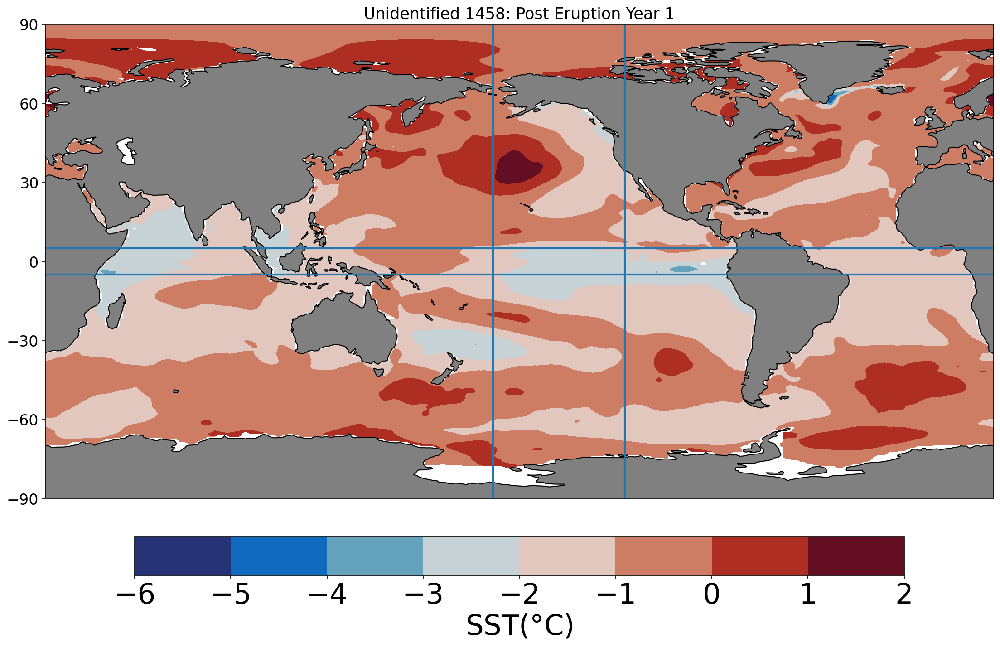

In [18]:
projection=ccrs.PlateCarree(central_longitude = -160)
fig,ax= plt.subplots(figsize =(18,15),subplot_kw=dict(projection=projection))

ax.add_feature(cfeature.LAND, color = 'gray')
ax.add_feature(cfeature.COASTLINE)
ax.set_global()


p = plt.contourf(new_lons,new_lats, plot_data,
                transform=ccrs.PlateCarree(),cmap= 'cmo.balance',zorder=-1) #'cmo.balance' or 'coolwarm'
ax.set_yticks([-90, -60, -30, 0, 30, 60, 90], crs=projection)
plt.axhline(y=5)
plt.axhline(y=-5)
plt.axvline(x=-10)
plt.axvline(x=40)
plt.title('Unidentified 1458: Post Eruption Year 1')
cbar = plt.colorbar(p, orientation='horizontal', pad=0.05, fraction=0.05,ax=ax)
cbar.ax.tick_params(labelsize=30)
cbar.set_label('SST' + "($\degree$C)", size = 30)

#### Year 2

In [19]:
unident1_post_2yr_anomaly = unident1_post_2yr-monthlydata
unident1_post_2yr_anomaly

<xarray.Dataset>
Dimensions:                 (lat_aux_grid: 395, moc_z: 61, month: 12, nlat: 384, nlon: 320, z_t: 60, z_t_150m: 15, z_w: 60, z_w_bot: 60, z_w_top: 60)
Coordinates:
  * z_t                     (z_t) float32 500.0 1.5e+03 ... 5.125e+05 5.375e+05
  * z_t_150m                (z_t_150m) float32 500.0 1.5e+03 ... 1.45e+04
  * z_w                     (z_w) float32 0.0 1e+03 2e+03 ... 5e+05 5.25e+05
  * z_w_top                 (z_w_top) float32 0.0 1e+03 2e+03 ... 5e+05 5.25e+05
  * z_w_bot                 (z_w_bot) float32 1e+03 2e+03 ... 5.25e+05 5.5e+05
  * lat_aux_grid            (lat_aux_grid) float32 -79.49 -78.95 ... 89.47 90.0
  * moc_z                   (moc_z) float32 0.0 1e+03 2e+03 ... 5.25e+05 5.5e+05
    ULONG                   (nlat, nlon) float64 dask.array<chunksize=(384, 320), meta=np.ndarray>
    ULAT                    (nlat, nlon) float64 dask.array<chunksize=(384, 320), meta=np.ndarray>
    TLONG                   (nlat, nlon) float64 dask.array<chunksize=(384, 320), meta=np.ndarray>
    TLAT                    (nlat, nlon) float64 dask.array<chunksize=(384, 320), meta=np.ndarray>
  * month                   (month) int64 1 2 3 4 5 6 7 8 9 10 11 12
Dimensions without coordinates: nlat, nlon
Data variables:
    dz                      (month, z_t) float32 dask.array<chunksize=(1, 60), meta=np.ndarray>
    dzw                     (month, z_w) float32 dask.array<chunksize=(1, 60), meta=np.ndarray>
    KMT                     (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    KMU                     (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    REGION_MASK             (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    UAREA                   (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    TAREA                   (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    HU                      (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    HT                      (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    DXU                     (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    DYU                     (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    DXT                     (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    DYT                     (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    HTN                     (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    HTE                     (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    HUS                     (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    HUW                     (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    ANGLE                   (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    ANGLET                  (month, nlat, nlon) float64 dask.array<chunksize=(1, 384, 320), meta=np.ndarray>
    days_in_norm_year       (month) timedelta64[ns] 00:00:00 ... 00:00:00
    grav                    (month) float64 -4.547e-13 -4.547e-13 ... -4.547e-13
    omega                   (month) float64 1.355e-20 1.355e-20 ... 1.355e-20
    radius                  (month) float64 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    cp_sw                   (month) float64 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    sound                   (month) float64 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    vonkar                  (month) float64 -1.11e-16 -1.11e-16 ... -1.11e-16
    cp_air                  (month) float64 1.137e-13 1.137e-13 ... 1.137e-13
    rho_air                 (month) float64 -6.661e-16 -6.661e-16 ... 

In [20]:
from scipy.ndimage import uniform_filter1d

def rolling_mean(a, W, axis=-1):
    # a : Input ndarray
    # W : Window size
    # axis : Axis along which we will apply rolling/sliding mean
    hW = W//2
    L = a.shape[axis]-W+1   
    indexer = [slice(None) for _ in range(a.ndim)]
    indexer[axis] = slice(hW,hW+L)
    return uniform_filter1d(a,W,axis=axis)[tuple(indexer)]

def ENSO_area_mean(var):  
    # assumes 2D field as var input
    # make sure masking is correct, otherwise we get nans
    var = np.ma.masked_invalid(var)
    # resulting variable should have dimensions of depth and time (x)
    ave = np.zeros(var.shape[0])
    # loop over time
    for t in np.arange(var.shape[0]):
        ave[t] = np.ma.average(var[t,167:206,203:248])
    return ave

In [21]:
unident1_post_2yr_rm=rolling_mean(unident1_post_2yr_anomaly['TEMP'][:,0,:,:],5,axis=0)

/glade/u/ssg/ch/usr/jupyterhub/envs/npl-3.7.9/dav/lib/python3.7/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


In [22]:
ENSO_area_mean(unident1_post_2yr_rm)

array([1.30241901, 0.96772635, 0.6722506 , 0.34558025, 0.27475904,
       0.44234219, 0.73301366, 1.00680992])

In [23]:
plot_data,new_lats,new_lons = pop_add_cyclic(unident1_post_2yr_rm[0],data['TLAT'],data['TLONG'])

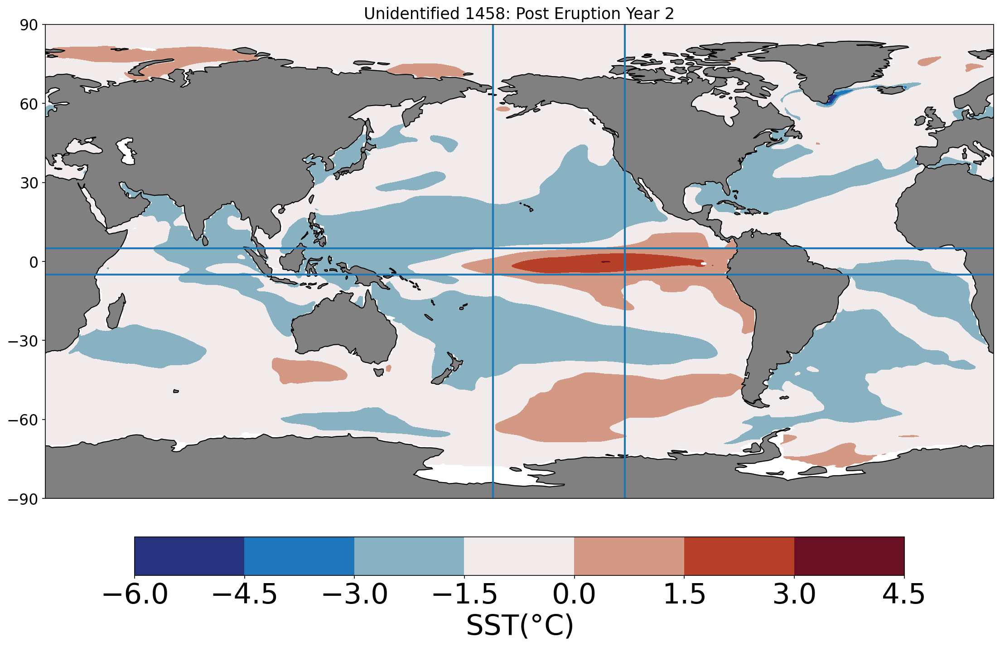

In [24]:
projection=ccrs.PlateCarree(central_longitude = -160)
fig,ax= plt.subplots(figsize =(18,15),subplot_kw=dict(projection=projection))

ax.add_feature(cfeature.LAND, color = 'gray')
ax.add_feature(cfeature.COASTLINE)
ax.set_global()


p = plt.contourf(new_lons,new_lats, plot_data,
                transform=ccrs.PlateCarree(),cmap= 'cmo.balance',zorder=-1) #'cmo.balance' or 'coolwarm'
ax.set_yticks([-90, -60, -30, 0, 30, 60, 90], crs=projection)
plt.axhline(y=5)
plt.axhline(y=-5)
plt.axvline(x=-10)
plt.axvline(x=40)
plt.title('Unidentified 1458: Post Eruption Year 2')
cbar = plt.colorbar(p, orientation='horizontal', pad=0.05, fraction=0.05,ax=ax)
cbar.ax.tick_params(labelsize=30)
cbar.set_label('SST' + "($\degree$C)", size = 30)

#### Year 3

In [26]:
unident1_post_3yr_anomaly = unident1_post_3yr-monthlydata

In [27]:
from scipy.ndimage import uniform_filter1d

def rolling_mean(a, W, axis=-1):
    # a : Input ndarray
    # W : Window size
    # axis : Axis along which we will apply rolling/sliding mean
    hW = W//2
    L = a.shape[axis]-W+1   
    indexer = [slice(None) for _ in range(a.ndim)]
    indexer[axis] = slice(hW,hW+L)
    return uniform_filter1d(a,W,axis=axis)[tuple(indexer)]

def ENSO_area_mean(var):  
    # assumes 2D field as var input
    # make sure masking is correct, otherwise we get nans
    var = np.ma.masked_invalid(var)
    # resulting variable should have dimensions of depth and time (x)
    ave = np.zeros(var.shape[0])
    # loop over time
    for t in np.arange(var.shape[0]):
        ave[t] = np.ma.average(var[t,167:206,203:248])
    return ave

In [28]:
unident1_post_3yr_rm=rolling_mean(unident1_post_3yr_anomaly['TEMP'][:,0,:,:],5,axis=0)

/glade/u/ssg/ch/usr/jupyterhub/envs/npl-3.7.9/dav/lib/python3.7/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


In [29]:
ENSO_area_mean(unident1_post_3yr_rm)

array([-2.41813847, -2.66341814, -2.8046505 , -2.65220909, -2.32517765,
       -1.98404308, -1.59036389, -1.42184606])

In [30]:
plot_data,new_lats,new_lons = pop_add_cyclic(unident1_post_3yr_rm[0],data['TLAT'],data['TLONG'])

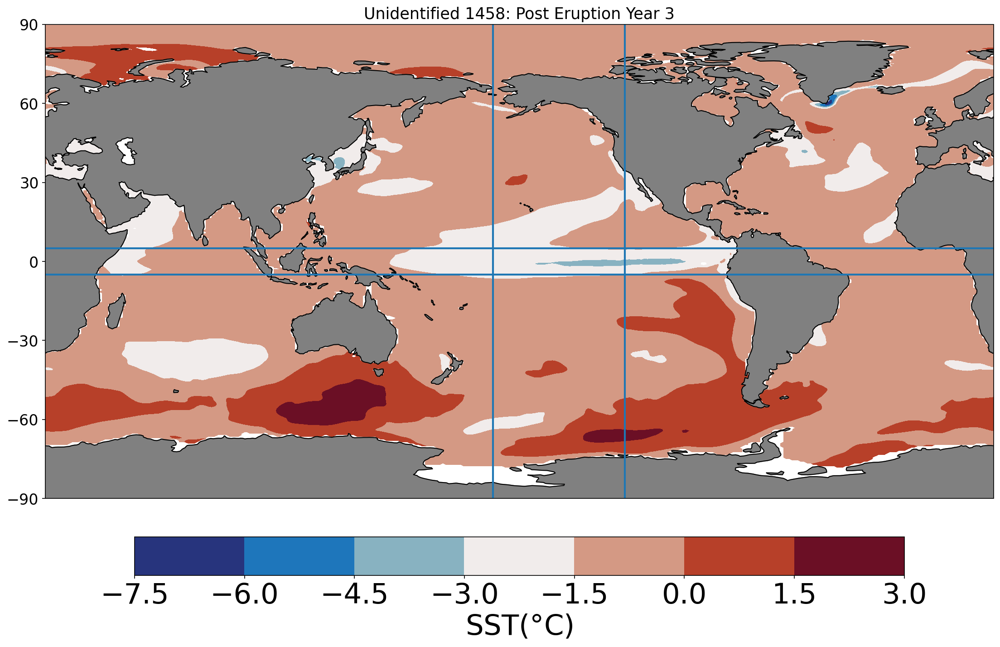

In [31]:
projection=ccrs.PlateCarree(central_longitude = -160)
fig,ax= plt.subplots(figsize =(18,15),subplot_kw=dict(projection=projection))

ax.add_feature(cfeature.LAND, color = 'gray')
ax.add_feature(cfeature.COASTLINE)
ax.set_global()


p = plt.contourf(new_lons,new_lats, plot_data,
                transform=ccrs.PlateCarree(),cmap= 'cmo.balance',zorder=-1) #'cmo.balance' or 'coolwarm'
ax.set_yticks([-90, -60, -30, 0, 30, 60, 90], crs=projection)
plt.axhline(y=5)
plt.axhline(y=-5)
plt.axvline(x=-10)
plt.axvline(x=40)
plt.title('Unidentified 1458: Post Eruption Year 3')
cbar = plt.colorbar(p, orientation='horizontal', pad=0.05, fraction=0.05,ax=ax)
cbar.ax.tick_params(labelsize=30)
cbar.set_label('SST' + "($\degree$C)", size = 30)

### Tambora 1815: Post Eruption Years

In [33]:
tambora_post_1yr = data.sel(time=slice('1815-05-01 00:00:00','1816-05-01 00:00:00')).groupby('time.month').mean(dim='time')
tambora_post_2yr = data.sel(time=slice('1816-05-01 00:00:00','1817-05-01 00:00:00')).groupby('time.month').mean(dim='time')
tambora_post_3yr = data.sel(time=slice('1818-05-01 00:00:00','1819-05-01 00:00:00')).groupby('time.month').mean(dim='time')

#### Year 1

In [34]:
tambora_post_1yr_anomaly = tambora_post_1yr-monthlydata

In [35]:
from scipy.ndimage import uniform_filter1d

def rolling_mean(a, W, axis=-1):
    # a : Input ndarray
    # W : Window size
    # axis : Axis along which we will apply rolling/sliding mean
    hW = W//2
    L = a.shape[axis]-W+1   
    indexer = [slice(None) for _ in range(a.ndim)]
    indexer[axis] = slice(hW,hW+L)
    return uniform_filter1d(a,W,axis=axis)[tuple(indexer)]

def ENSO_area_mean(var):  
    # assumes 2D field as var input
    # make sure masking is correct, otherwise we get nans
    var = np.ma.masked_invalid(var)
    # resulting variable should have dimensions of depth and time (x)
    ave = np.zeros(var.shape[0])
    # loop over time
    for t in np.arange(var.shape[0]):
        ave[t] = np.ma.average(var[t,167:206,203:248])
    return ave

In [36]:
tambora_post_1yr_rm=rolling_mean(tambora_post_1yr_anomaly['TEMP'][:,0,:,:],5,axis=0)

/glade/u/ssg/ch/usr/jupyterhub/envs/npl-3.7.9/dav/lib/python3.7/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


In [37]:
ENSO_area_mean(tambora_post_1yr_rm)

array([-2.0083894 , -1.75524089, -1.56844729, -1.50388983, -1.6005954 ,
       -1.72391437, -1.91938087, -2.11541661])

In [38]:
plot_data,new_lats,new_lons = pop_add_cyclic(tambora_post_1yr_rm[0],data['TLAT'],data['TLONG'])

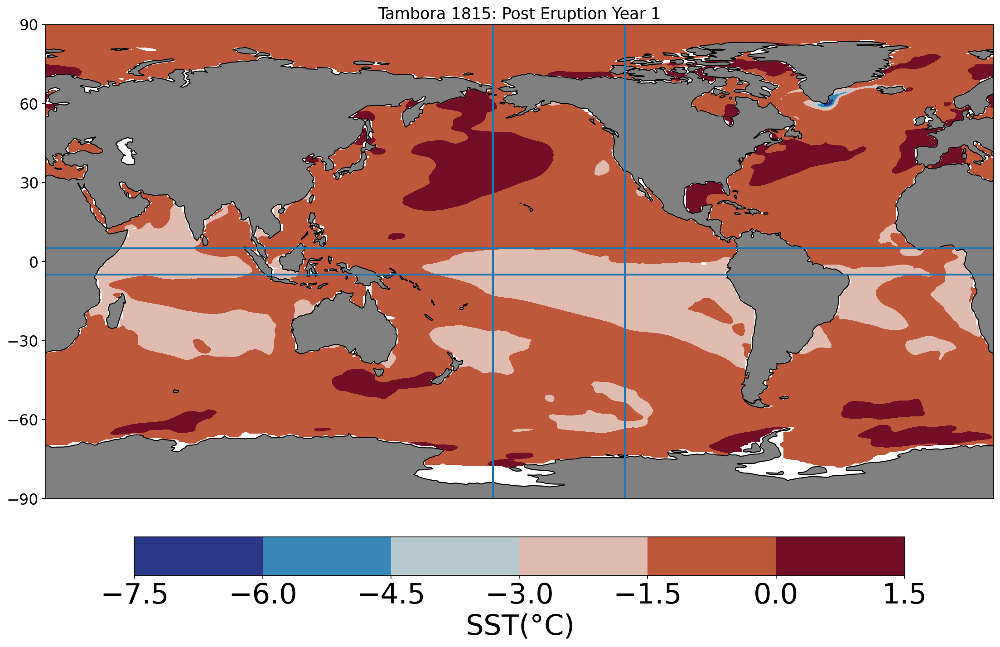

In [39]:
projection=ccrs.PlateCarree(central_longitude = -160)
fig,ax= plt.subplots(figsize =(18,15),subplot_kw=dict(projection=projection))

ax.add_feature(cfeature.LAND, color = 'gray')
ax.add_feature(cfeature.COASTLINE)
ax.set_global()


p = plt.contourf(new_lons,new_lats, plot_data,
                transform=ccrs.PlateCarree(),cmap= 'cmo.balance',zorder=-1) #'cmo.balance' or 'coolwarm'
ax.set_yticks([-90, -60, -30, 0, 30, 60, 90], crs=projection)
plt.axhline(y=5)
plt.axhline(y=-5)
plt.axvline(x=-10)
plt.axvline(x=40)
plt.title('Tambora 1815: Post Eruption Year 1')
cbar = plt.colorbar(p, orientation='horizontal', pad=0.05, fraction=0.05,ax=ax)
cbar.ax.tick_params(labelsize=30)
cbar.set_label('SST' + "($\degree$C)", size = 30)

#### Year 2

In [47]:
tambora_post_2yr_anomaly = tambora_post_2yr-monthlydata

In [48]:
from scipy.ndimage import uniform_filter1d

def rolling_mean(a, W, axis=-1):
    # a : Input ndarray
    # W : Window size
    # axis : Axis along which we will apply rolling/sliding mean
    hW = W//2
    L = a.shape[axis]-W+1   
    indexer = [slice(None) for _ in range(a.ndim)]
    indexer[axis] = slice(hW,hW+L)
    return uniform_filter1d(a,W,axis=axis)[tuple(indexer)]

def ENSO_area_mean(var):  
    # assumes 2D field as var input
    # make sure masking is correct, otherwise we get nans
    var = np.ma.masked_invalid(var)
    # resulting variable should have dimensions of depth and time (x)
    ave = np.zeros(var.shape[0])
    # loop over time
    for t in np.arange(var.shape[0]):
        ave[t] = np.ma.average(var[t,167:206,203:248])
    return ave

In [49]:
tambora_post_2yr_rm=rolling_mean(tambora_post_2yr_anomaly['TEMP'][:,0,:,:],5,axis=0)

/glade/u/ssg/ch/usr/jupyterhub/envs/npl-3.7.9/dav/lib/python3.7/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


In [50]:
ENSO_area_mean(tambora_post_2yr_rm)

array([ 0.47109521,  0.23667354, -0.00529227, -0.25637407, -0.49574621,
       -0.52374754, -0.33510725, -0.14890248])

In [51]:
plot_data,new_lats,new_lons = pop_add_cyclic(tambora_post_2yr_rm[0],data['TLAT'],data['TLONG'])

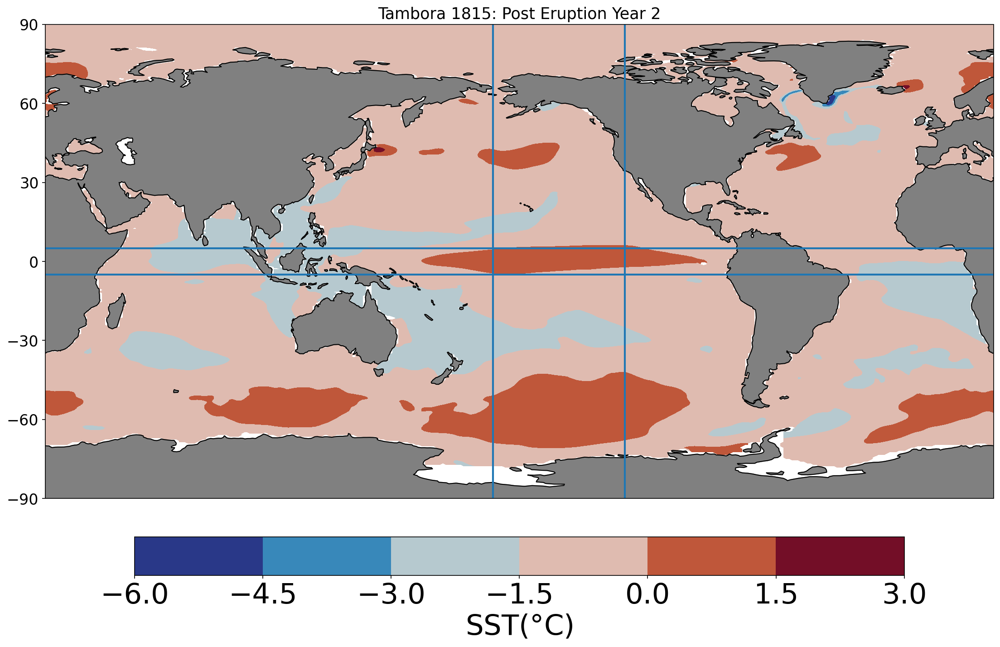

In [53]:
projection=ccrs.PlateCarree(central_longitude = -160)
fig,ax= plt.subplots(figsize =(18,15),subplot_kw=dict(projection=projection))

ax.add_feature(cfeature.LAND, color = 'gray')
ax.add_feature(cfeature.COASTLINE)
ax.set_global()


p = plt.contourf(new_lons,new_lats, plot_data,
                transform=ccrs.PlateCarree(),cmap= 'cmo.balance',zorder=-1) #'cmo.balance' or 'coolwarm'
ax.set_yticks([-90, -60, -30, 0, 30, 60, 90], crs=projection)
plt.axhline(y=5)
plt.axhline(y=-5)
plt.axvline(x=-10)
plt.axvline(x=40)
plt.title('Tambora 1815: Post Eruption Year 2')
cbar = plt.colorbar(p, orientation='horizontal', pad=0.05, fraction=0.05,ax=ax)
cbar.ax.tick_params(labelsize=30)
cbar.set_label('SST' + "($\degree$C)", size = 30)

#### Year 3

In [54]:
tambora_post_3yr_anomaly = tambora_post_3yr-monthlydata

In [55]:
from scipy.ndimage import uniform_filter1d

def rolling_mean(a, W, axis=-1):
    # a : Input ndarray
    # W : Window size
    # axis : Axis along which we will apply rolling/sliding mean
    hW = W//2
    L = a.shape[axis]-W+1   
    indexer = [slice(None) for _ in range(a.ndim)]
    indexer[axis] = slice(hW,hW+L)
    return uniform_filter1d(a,W,axis=axis)[tuple(indexer)]

def ENSO_area_mean(var):  
    # assumes 2D field as var input
    # make sure masking is correct, otherwise we get nans
    var = np.ma.masked_invalid(var)
    # resulting variable should have dimensions of depth and time (x)
    ave = np.zeros(var.shape[0])
    # loop over time
    for t in np.arange(var.shape[0]):
        ave[t] = np.ma.average(var[t,167:206,203:248])
    return ave

In [56]:
tambora_post_3yr_rm=rolling_mean(tambora_post_3yr_anomaly['TEMP'][:,0,:,:],5,axis=0)

/glade/u/ssg/ch/usr/jupyterhub/envs/npl-3.7.9/dav/lib/python3.7/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


In [57]:
ENSO_area_mean(tambora_post_3yr_rm)

array([-1.58035607, -1.22428872, -0.98539587, -0.87394637, -0.90804683,
       -1.21596749, -1.61420356, -1.87651771])

In [58]:
plot_data,new_lats,new_lons = pop_add_cyclic(tambora_post_3yr_rm[0],data['TLAT'],data['TLONG'])

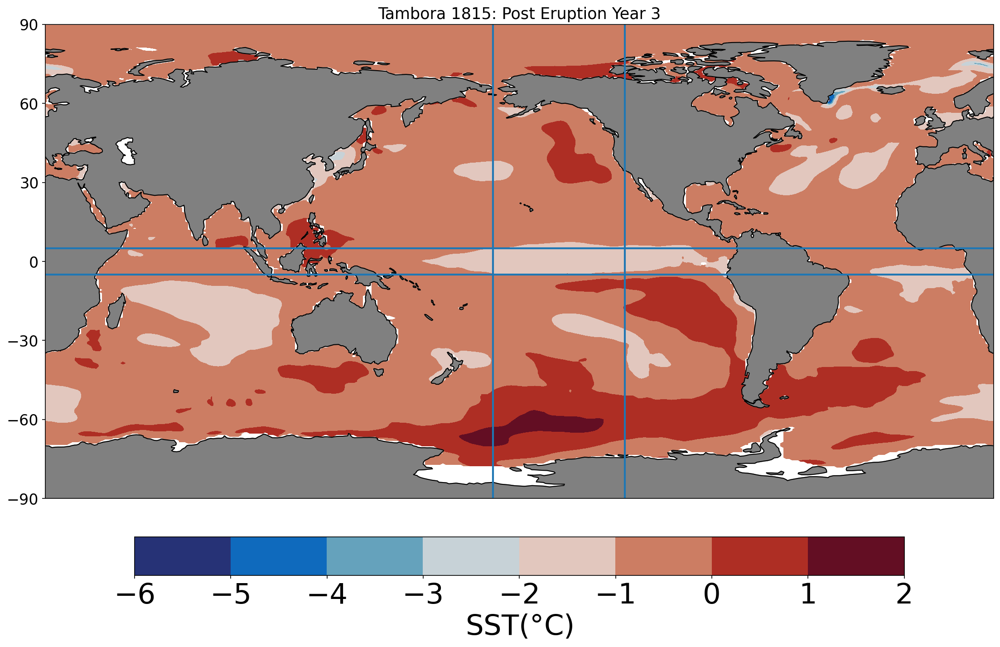

In [63]:
projection=ccrs.PlateCarree(central_longitude = -160)
fig,ax= plt.subplots(figsize =(18,15),subplot_kw=dict(projection=projection))

ax.add_feature(cfeature.LAND, color = 'gray')
ax.add_feature(cfeature.COASTLINE)
ax.set_global()


p = plt.contourf(new_lons,new_lats, plot_data,
                transform=ccrs.PlateCarree(),cmap= 'cmo.balance',zorder=-1) #'cmo.balance' or 'coolwarm'
ax.set_yticks([-90, -60, -30, 0, 30, 60, 90], crs=projection)
plt.axhline(y=5)
plt.axhline(y=-5)
plt.axvline(x=-10)
plt.axvline(x=40)
plt.title('Tambora 1815: Post Eruption Year 3')
cbar = plt.colorbar(p, orientation='horizontal', pad=0.05, fraction=0.05,ax=ax)
cbar.ax.tick_params(labelsize=30)
cbar.set_label('SST' + "($\degree$C)", size = 30)

### Unidentified_2 1230: Post Eruption Years

In [12]:
unident2_post_1yr = data.sel(time=slice('1230-08-01 00:00:00','1231-08-01 00:00:00')).groupby('time.month').mean(dim='time')
unident2_post_2yr = data.sel(time=slice('1231-08-01 00:00:00','1232-08-01 00:00:00')).groupby('time.month').mean(dim='time')
unident2_post_3yr = data.sel(time=slice('1232-08-01 00:00:00','1233-08-01 00:00:00')).groupby('time.month').mean(dim='time')

#### Year 1

In [13]:
unident2_post_1yr_anomaly = unident2_post_1yr-monthlydata

In [14]:
from scipy.ndimage import uniform_filter1d

def rolling_mean(a, W, axis=-1):
    # a : Input ndarray
    # W : Window size
    # axis : Axis along which we will apply rolling/sliding mean
    hW = W//2
    L = a.shape[axis]-W+1   
    indexer = [slice(None) for _ in range(a.ndim)]
    indexer[axis] = slice(hW,hW+L)
    return uniform_filter1d(a,W,axis=axis)[tuple(indexer)]

def ENSO_area_mean(var):  
    # assumes 2D field as var input
    # make sure masking is correct, otherwise we get nans
    var = np.ma.masked_invalid(var)
    # resulting variable should have dimensions of depth and time (x)
    ave = np.zeros(var.shape[0])
    # loop over time
    for t in np.arange(var.shape[0]):
        ave[t] = np.ma.average(var[t,167:206,203:248])
    return ave

In [15]:
unident2_post_1yr_rm=rolling_mean(unident2_post_1yr_anomaly['TEMP'][:,0,:,:],5,axis=0)

/glade/u/ssg/ch/usr/jupyterhub/envs/npl-3.7.9/dav/lib/python3.7/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


In [16]:
ENSO_area_mean(unident2_post_1yr_rm)

array([-0.1949746 , -0.05354142,  0.14955883,  0.31368001,  0.23953704,
        0.05896818, -0.15364441, -0.43785759])

In [17]:
plot_data,new_lats,new_lons = pop_add_cyclic(unident2_post_1yr_rm[0],data['TLAT'],data['TLONG'])

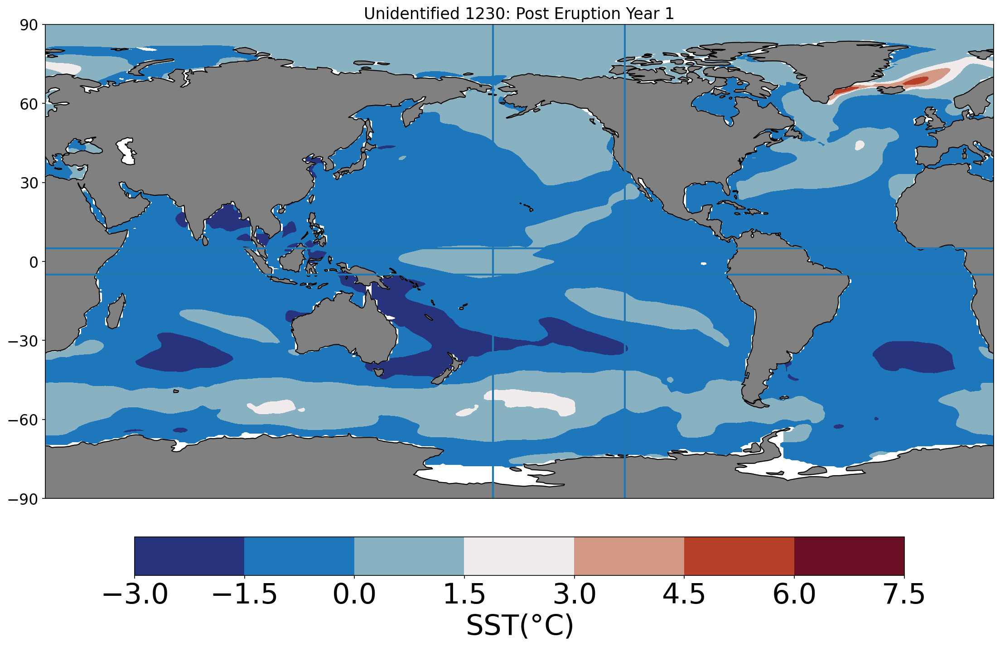

In [18]:
projection=ccrs.PlateCarree(central_longitude = -160)
fig,ax= plt.subplots(figsize =(18,15),subplot_kw=dict(projection=projection))

ax.add_feature(cfeature.LAND, color = 'gray')
ax.add_feature(cfeature.COASTLINE)
ax.set_global()


p = plt.contourf(new_lons,new_lats, plot_data,
                transform=ccrs.PlateCarree(),cmap= 'cmo.balance',zorder=-1) #'cmo.balance' or 'coolwarm'
ax.set_yticks([-90, -60, -30, 0, 30, 60, 90], crs=projection)
plt.axhline(y=5)
plt.axhline(y=-5)
plt.axvline(x=-10)
plt.axvline(x=40)
plt.title('Unidentified 1230: Post Eruption Year 1')
cbar = plt.colorbar(p, orientation='horizontal', pad=0.05, fraction=0.05,ax=ax)
cbar.ax.tick_params(labelsize=30)
cbar.set_label('SST' + "($\degree$C)", size = 30)

#### Year 2

In [19]:
unident2_post_2yr_anomaly = unident2_post_2yr-monthlydata

In [20]:
from scipy.ndimage import uniform_filter1d

def rolling_mean(a, W, axis=-1):
    # a : Input ndarray
    # W : Window size
    # axis : Axis along which we will apply rolling/sliding mean
    hW = W//2
    L = a.shape[axis]-W+1   
    indexer = [slice(None) for _ in range(a.ndim)]
    indexer[axis] = slice(hW,hW+L)
    return uniform_filter1d(a,W,axis=axis)[tuple(indexer)]

def ENSO_area_mean(var):  
    # assumes 2D field as var input
    # make sure masking is correct, otherwise we get nans
    var = np.ma.masked_invalid(var)
    # resulting variable should have dimensions of depth and time (x)
    ave = np.zeros(var.shape[0])
    # loop over time
    for t in np.arange(var.shape[0]):
        ave[t] = np.ma.average(var[t,167:206,203:248])
    return ave

In [21]:
unident2_post_2yr_rm=rolling_mean(unident2_post_2yr_anomaly['TEMP'][:,0,:,:],5,axis=0)

/glade/u/ssg/ch/usr/jupyterhub/envs/npl-3.7.9/dav/lib/python3.7/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


In [22]:
ENSO_area_mean(unident2_post_2yr_rm)

array([2.08007701, 1.79592042, 1.46347934, 1.19097528, 1.27332162,
       1.52915526, 1.86600895, 2.2511179 ])

In [23]:
plot_data,new_lats,new_lons = pop_add_cyclic(unident2_post_2yr_rm[0],data['TLAT'],data['TLONG'])

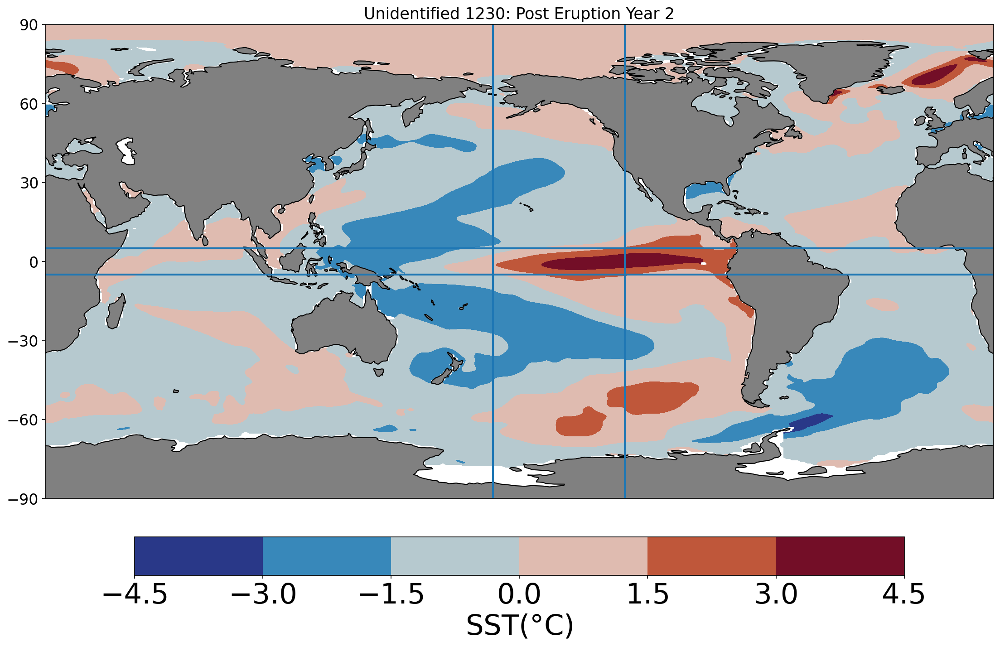

In [24]:
projection=ccrs.PlateCarree(central_longitude = -160)
fig,ax= plt.subplots(figsize =(18,15),subplot_kw=dict(projection=projection))

ax.add_feature(cfeature.LAND, color = 'gray')
ax.add_feature(cfeature.COASTLINE)
ax.set_global()


p = plt.contourf(new_lons,new_lats, plot_data,
                transform=ccrs.PlateCarree(),cmap= 'cmo.balance',zorder=-1) #'cmo.balance' or 'coolwarm'
ax.set_yticks([-90, -60, -30, 0, 30, 60, 90], crs=projection)
plt.axhline(y=5)
plt.axhline(y=-5)
plt.axvline(x=-10)
plt.axvline(x=40)
plt.title('Unidentified 1230: Post Eruption Year 2')
cbar = plt.colorbar(p, orientation='horizontal', pad=0.05, fraction=0.05,ax=ax)
cbar.ax.tick_params(labelsize=30)
cbar.set_label('SST' + "($\degree$C)", size = 30)

#### Year 3

In [31]:
unident2_post_3yr_anomaly = unident2_post_3yr-monthlydata

In [32]:
from scipy.ndimage import uniform_filter1d

def rolling_mean(a, W, axis=-1):
    # a : Input ndarray
    # W : Window size
    # axis : Axis along which we will apply rolling/sliding mean
    hW = W//2
    L = a.shape[axis]-W+1   
    indexer = [slice(None) for _ in range(a.ndim)]
    indexer[axis] = slice(hW,hW+L)
    return uniform_filter1d(a,W,axis=axis)[tuple(indexer)]

def ENSO_area_mean(var):  
    # assumes 2D field as var input
    # make sure masking is correct, otherwise we get nans
    var = np.ma.masked_invalid(var)
    # resulting variable should have dimensions of depth and time (x)
    ave = np.zeros(var.shape[0])
    # loop over time
    for t in np.arange(var.shape[0]):
        ave[t] = np.ma.average(var[t,167:206,203:248])
    return ave

In [33]:
unident2_post_3yr_rm=rolling_mean(unident2_post_3yr_anomaly['TEMP'][:,0,:,:],5,axis=0)

/glade/u/ssg/ch/usr/jupyterhub/envs/npl-3.7.9/dav/lib/python3.7/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


In [34]:
ENSO_area_mean(unident2_post_3yr_rm)

array([-0.65081436, -0.56764765, -0.51952235, -0.47782156, -0.45839663,
       -0.397058  , -0.30704314, -0.24319768])

In [35]:
plot_data,new_lats,new_lons = pop_add_cyclic(unident2_post_3yr_rm[0],data['TLAT'],data['TLONG'])

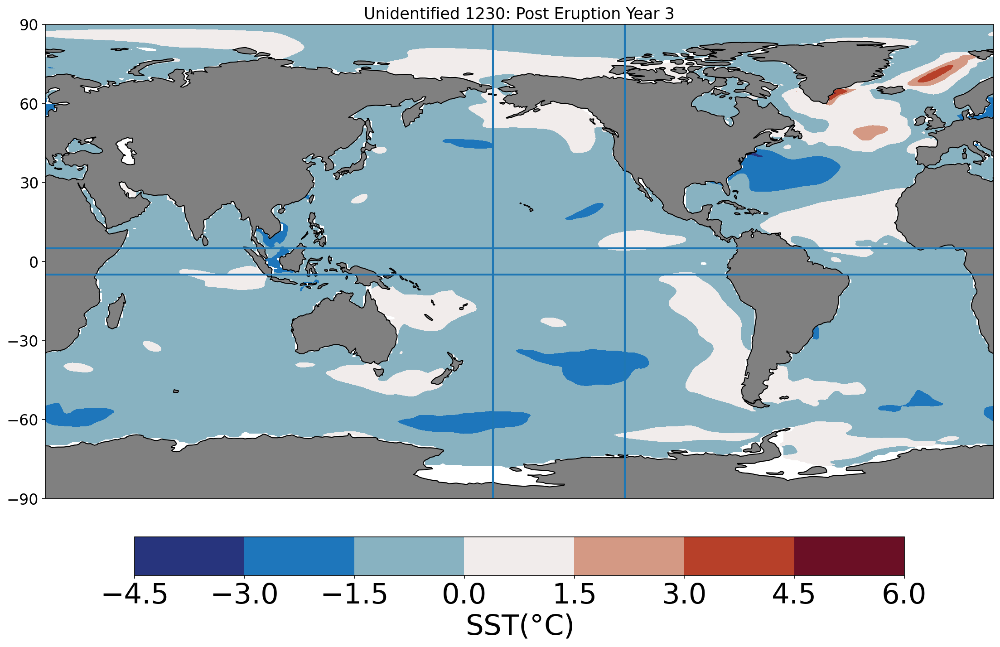

In [36]:
projection=ccrs.PlateCarree(central_longitude = -160)
fig,ax= plt.subplots(figsize =(18,15),subplot_kw=dict(projection=projection))

ax.add_feature(cfeature.LAND, color = 'gray')
ax.add_feature(cfeature.COASTLINE)
ax.set_global()


p = plt.contourf(new_lons,new_lats, plot_data,
                transform=ccrs.PlateCarree(),cmap= 'cmo.balance',zorder=-1) #'cmo.balance' or 'coolwarm'
ax.set_yticks([-90, -60, -30, 0, 30, 60, 90], crs=projection)
plt.axhline(y=5)
plt.axhline(y=-5)
plt.axvline(x=-10)
plt.axvline(x=40)
plt.title('Unidentified 1230: Post Eruption Year 3')
cbar = plt.colorbar(p, orientation='horizontal', pad=0.05, fraction=0.05,ax=ax)
cbar.ax.tick_params(labelsize=30)
cbar.set_label('SST' + "($\degree$C)", size = 30)

### Grimsvotn (Laki) 1783: Post Eruption Years

In [37]:
laki_post_1yr = data.sel(time=slice('1783-11-01 00:00:00','1784-11-01 00:00:00')).groupby('time.month').mean(dim='time')
laki_post_2yr = data.sel(time=slice('1784-11-01 00:00:00','1785-11-01 00:00:00')).groupby('time.month').mean(dim='time')
laki_post_3yr = data.sel(time=slice('1785-11-01 00:00:00','1786-11-01 00:00:00')).groupby('time.month').mean(dim='time')

#### Year 1

In [38]:
laki_post_1yr_anomaly = laki_post_1yr-monthlydata

In [39]:
from scipy.ndimage import uniform_filter1d

def rolling_mean(a, W, axis=-1):
    # a : Input ndarray
    # W : Window size
    # axis : Axis along which we will apply rolling/sliding mean
    hW = W//2
    L = a.shape[axis]-W+1   
    indexer = [slice(None) for _ in range(a.ndim)]
    indexer[axis] = slice(hW,hW+L)
    return uniform_filter1d(a,W,axis=axis)[tuple(indexer)]

def ENSO_area_mean(var):  
    # assumes 2D field as var input
    # make sure masking is correct, otherwise we get nans
    var = np.ma.masked_invalid(var)
    # resulting variable should have dimensions of depth and time (x)
    ave = np.zeros(var.shape[0])
    # loop over time
    for t in np.arange(var.shape[0]):
        ave[t] = np.ma.average(var[t,167:206,203:248])
    return ave

In [40]:
laki_post_1yr_rm=rolling_mean(laki_post_1yr_anomaly['TEMP'][:,0,:,:],5,axis=0)

/glade/u/ssg/ch/usr/jupyterhub/envs/npl-3.7.9/dav/lib/python3.7/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


In [41]:
ENSO_area_mean(laki_post_1yr_rm)

array([0.57008568, 0.78245582, 1.04282004, 1.35656272, 1.70713364,
       2.06195858, 2.09774723, 1.75813913])

In [42]:
plot_data,new_lats,new_lons = pop_add_cyclic(laki_post_1yr_rm[0],data['TLAT'],data['TLONG'])

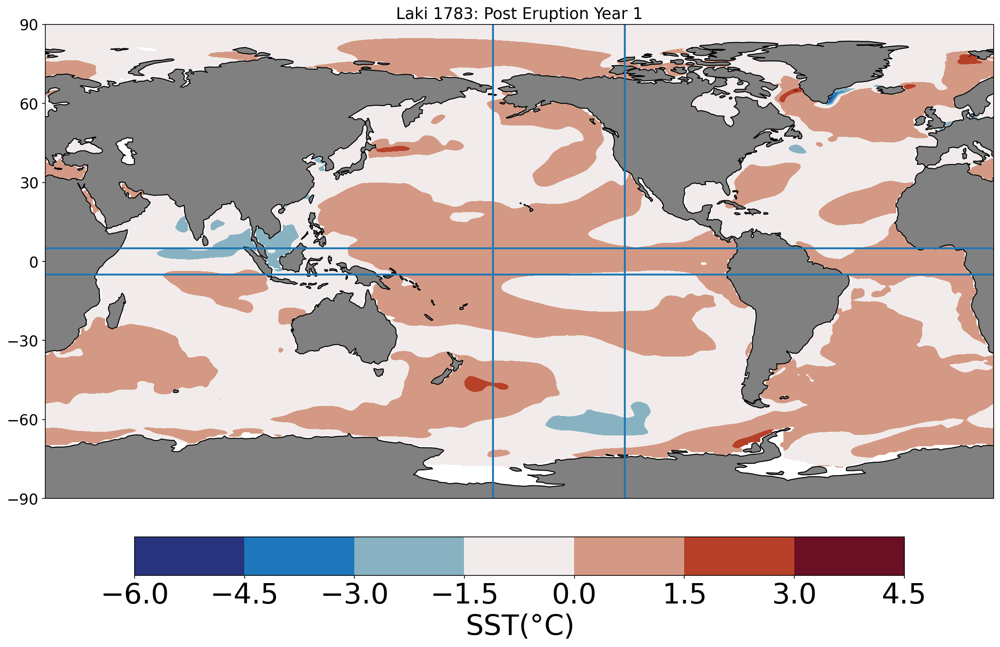

In [43]:
projection=ccrs.PlateCarree(central_longitude = -160)
fig,ax= plt.subplots(figsize =(18,15),subplot_kw=dict(projection=projection))

ax.add_feature(cfeature.LAND, color = 'gray')
ax.add_feature(cfeature.COASTLINE)
ax.set_global()


p = plt.contourf(new_lons,new_lats, plot_data,
                transform=ccrs.PlateCarree(),cmap= 'cmo.balance',zorder=-1) #'cmo.balance' or 'coolwarm'
ax.set_yticks([-90, -60, -30, 0, 30, 60, 90], crs=projection)
plt.axhline(y=5)
plt.axhline(y=-5)
plt.axvline(x=-10)
plt.axvline(x=40)
plt.title('Laki 1783: Post Eruption Year 1')
cbar = plt.colorbar(p, orientation='horizontal', pad=0.05, fraction=0.05,ax=ax)
cbar.ax.tick_params(labelsize=30)
cbar.set_label('SST' + "($\degree$C)", size = 30)

#### Year 2

In [44]:
laki_post_2yr_anomaly = laki_post_2yr-monthlydata

In [45]:
from scipy.ndimage import uniform_filter1d

def rolling_mean(a, W, axis=-1):
    # a : Input ndarray
    # W : Window size
    # axis : Axis along which we will apply rolling/sliding mean
    hW = W//2
    L = a.shape[axis]-W+1   
    indexer = [slice(None) for _ in range(a.ndim)]
    indexer[axis] = slice(hW,hW+L)
    return uniform_filter1d(a,W,axis=axis)[tuple(indexer)]

def ENSO_area_mean(var):  
    # assumes 2D field as var input
    # make sure masking is correct, otherwise we get nans
    var = np.ma.masked_invalid(var)
    # resulting variable should have dimensions of depth and time (x)
    ave = np.zeros(var.shape[0])
    # loop over time
    for t in np.arange(var.shape[0]):
        ave[t] = np.ma.average(var[t,167:206,203:248])
    return ave

In [46]:
laki_post_2yr_rm=rolling_mean(laki_post_2yr_anomaly['TEMP'][:,0,:,:],5,axis=0)

/glade/u/ssg/ch/usr/jupyterhub/envs/npl-3.7.9/dav/lib/python3.7/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


In [47]:
ENSO_area_mean(laki_post_2yr_rm)

array([ 2.58938079,  2.18974526,  1.68685953,  1.06605673,  0.43585598,
       -0.20330557, -0.37775253,  0.04442219])

In [48]:
plot_data,new_lats,new_lons = pop_add_cyclic(laki_post_2yr_rm[0],data['TLAT'],data['TLONG'])

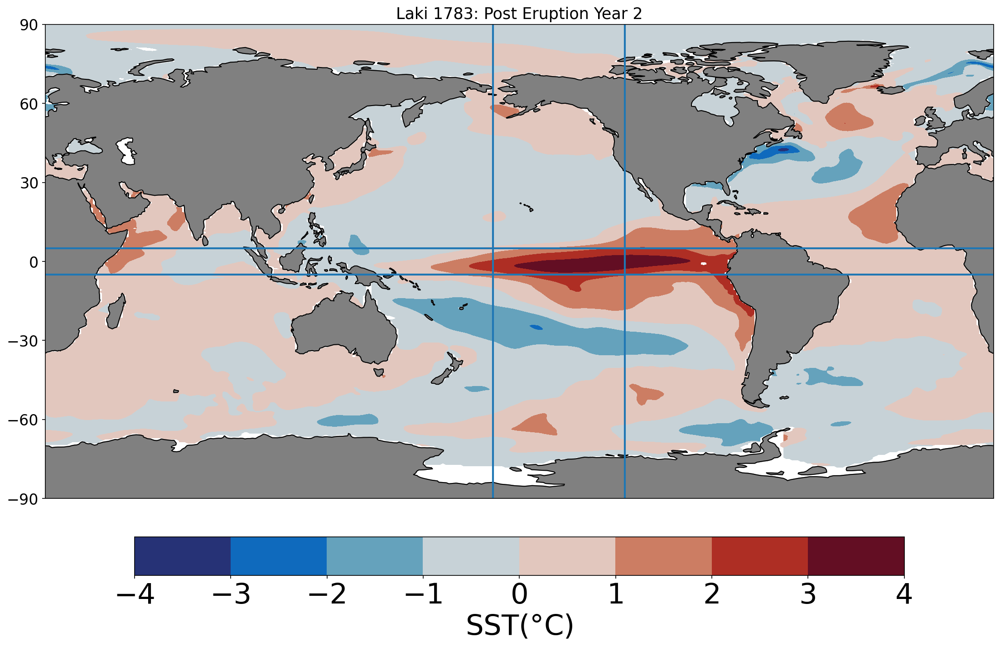

In [49]:
projection=ccrs.PlateCarree(central_longitude = -160)
fig,ax= plt.subplots(figsize =(18,15),subplot_kw=dict(projection=projection))

ax.add_feature(cfeature.LAND, color = 'gray')
ax.add_feature(cfeature.COASTLINE)
ax.set_global()


p = plt.contourf(new_lons,new_lats, plot_data,
                transform=ccrs.PlateCarree(),cmap= 'cmo.balance',zorder=-1) #'cmo.balance' or 'coolwarm'
ax.set_yticks([-90, -60, -30, 0, 30, 60, 90], crs=projection)
plt.axhline(y=5)
plt.axhline(y=-5)
plt.axvline(x=-10)
plt.axvline(x=40)
plt.title('Laki 1783: Post Eruption Year 2')
cbar = plt.colorbar(p, orientation='horizontal', pad=0.05, fraction=0.05,ax=ax)
cbar.ax.tick_params(labelsize=30)
cbar.set_label('SST' + "($\degree$C)", size = 30)

#### Year 3

In [50]:
laki_post_3yr_anomaly = laki_post_3yr-monthlydata

In [51]:
from scipy.ndimage import uniform_filter1d

def rolling_mean(a, W, axis=-1):
    # a : Input ndarray
    # W : Window size
    # axis : Axis along which we will apply rolling/sliding mean
    hW = W//2
    L = a.shape[axis]-W+1   
    indexer = [slice(None) for _ in range(a.ndim)]
    indexer[axis] = slice(hW,hW+L)
    return uniform_filter1d(a,W,axis=axis)[tuple(indexer)]

def ENSO_area_mean(var):  
    # assumes 2D field as var input
    # make sure masking is correct, otherwise we get nans
    var = np.ma.masked_invalid(var)
    # resulting variable should have dimensions of depth and time (x)
    ave = np.zeros(var.shape[0])
    # loop over time
    for t in np.arange(var.shape[0]):
        ave[t] = np.ma.average(var[t,167:206,203:248])
    return ave

In [52]:
laki_post_3yr_rm=rolling_mean(laki_post_3yr_anomaly['TEMP'][:,0,:,:],5,axis=0)

/glade/u/ssg/ch/usr/jupyterhub/envs/npl-3.7.9/dav/lib/python3.7/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


In [53]:
ENSO_area_mean(laki_post_3yr_rm)

array([-2.38576445, -2.10987483, -1.81388625, -1.54979425, -1.31774061,
       -1.20496141, -1.24990999, -1.53812684])

In [54]:
plot_data,new_lats,new_lons = pop_add_cyclic(laki_post_3yr_rm[0],data['TLAT'],data['TLONG'])

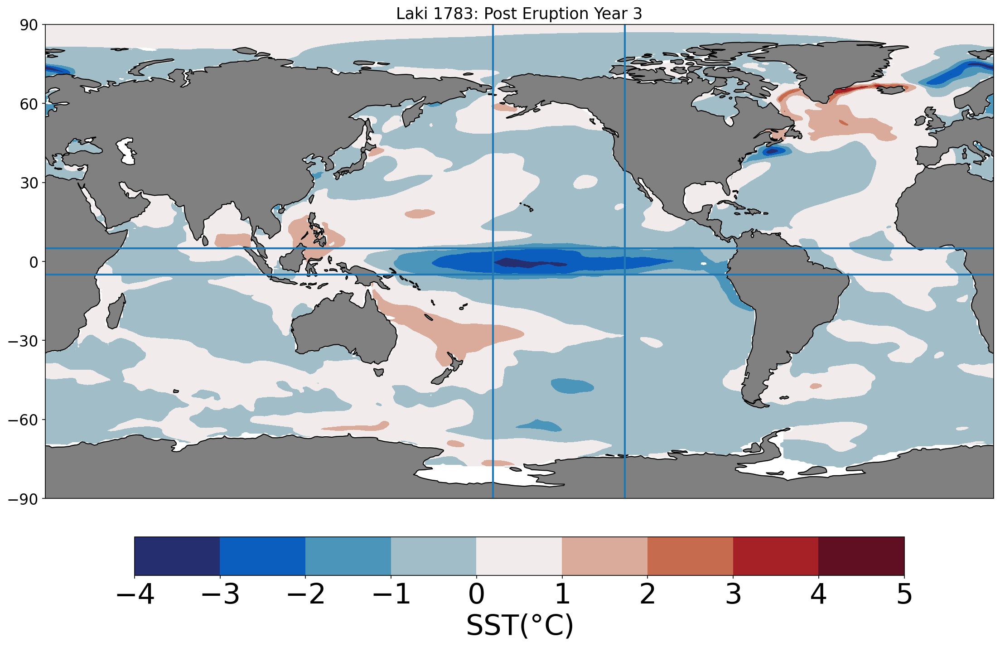

In [55]:
projection=ccrs.PlateCarree(central_longitude = -160)
fig,ax= plt.subplots(figsize =(18,15),subplot_kw=dict(projection=projection))

ax.add_feature(cfeature.LAND, color = 'gray')
ax.add_feature(cfeature.COASTLINE)
ax.set_global()


p = plt.contourf(new_lons,new_lats, plot_data,
                transform=ccrs.PlateCarree(),cmap= 'cmo.balance',zorder=-1) #'cmo.balance' or 'coolwarm'
ax.set_yticks([-90, -60, -30, 0, 30, 60, 90], crs=projection)
plt.axhline(y=5)
plt.axhline(y=-5)
plt.axvline(x=-10)
plt.axvline(x=40)
plt.title('Laki 1783: Post Eruption Year 3')
cbar = plt.colorbar(p, orientation='horizontal', pad=0.05, fraction=0.05,ax=ax)
cbar.ax.tick_params(labelsize=30)
cbar.set_label('SST' + "($\degree$C)", size = 30)

### Unidentified_3 1809: Post Eruption Years

In [12]:
unident3_post_1yr = data.sel(time=slice('1809-11-01 00:00:00','1810-11-01 00:00:00')).groupby('time.month').mean(dim='time')
unident3_post_2yr = data.sel(time=slice('1811-11-01 00:00:00','1812-11-01 00:00:00')).groupby('time.month').mean(dim='time')
unident3_post_3yr = data.sel(time=slice('1812-11-01 00:00:00','1813-11-01 00:00:00')).groupby('time.month').mean(dim='time')

#### Year 1

In [13]:
unident3_post_1yr_anomaly = unident3_post_1yr-monthlydata

In [14]:
from scipy.ndimage import uniform_filter1d

def rolling_mean(a, W, axis=-1):
    # a : Input ndarray
    # W : Window size
    # axis : Axis along which we will apply rolling/sliding mean
    hW = W//2
    L = a.shape[axis]-W+1   
    indexer = [slice(None) for _ in range(a.ndim)]
    indexer[axis] = slice(hW,hW+L)
    return uniform_filter1d(a,W,axis=axis)[tuple(indexer)]

def ENSO_area_mean(var):  
    # assumes 2D field as var input
    # make sure masking is correct, otherwise we get nans
    var = np.ma.masked_invalid(var)
    # resulting variable should have dimensions of depth and time (x)
    ave = np.zeros(var.shape[0])
    # loop over time
    for t in np.arange(var.shape[0]):
        ave[t] = np.ma.average(var[t,167:206,203:248])
    return ave

In [15]:
unident3_post_1yr_rm=rolling_mean(unident3_post_1yr_anomaly['TEMP'][:,0,:,:],5,axis=0)

/glade/u/ssg/ch/usr/jupyterhub/envs/npl-3.7.9/dav/lib/python3.7/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


In [16]:
ENSO_area_mean(unident3_post_1yr_rm)

array([1.49105068, 1.43082432, 1.37632949, 1.39344994, 1.46263619,
       1.54687166, 1.60762512, 1.59049771])

In [17]:
plot_data,new_lats,new_lons = pop_add_cyclic(unident3_post_1yr_rm[0],data['TLAT'],data['TLONG'])

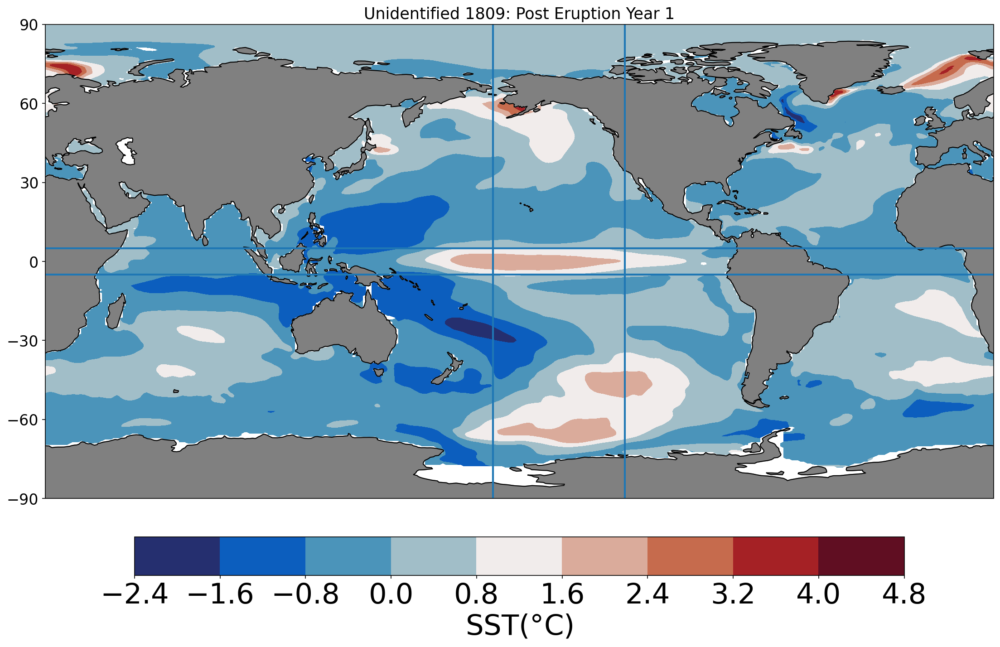

In [18]:
projection=ccrs.PlateCarree(central_longitude = -160)
fig,ax= plt.subplots(figsize =(18,15),subplot_kw=dict(projection=projection))

ax.add_feature(cfeature.LAND, color = 'gray')
ax.add_feature(cfeature.COASTLINE)
ax.set_global()


p = plt.contourf(new_lons,new_lats, plot_data,
                transform=ccrs.PlateCarree(),cmap= 'cmo.balance',zorder=-1) #'cmo.balance' or 'coolwarm'
ax.set_yticks([-90, -60, -30, 0, 30, 60, 90], crs=projection)
plt.axhline(y=5)
plt.axhline(y=-5)
plt.axvline(x=-10)
plt.axvline(x=40)
plt.title('Unidentified 1809: Post Eruption Year 1')
cbar = plt.colorbar(p, orientation='horizontal', pad=0.05, fraction=0.05,ax=ax)
cbar.ax.tick_params(labelsize=30)
cbar.set_label('SST' + "($\degree$C)", size = 30)

#### Year 2

In [19]:
unident3_post_2yr_anomaly = unident3_post_2yr-monthlydata

In [20]:
from scipy.ndimage import uniform_filter1d

def rolling_mean(a, W, axis=-1):
    # a : Input ndarray
    # W : Window size
    # axis : Axis along which we will apply rolling/sliding mean
    hW = W//2
    L = a.shape[axis]-W+1   
    indexer = [slice(None) for _ in range(a.ndim)]
    indexer[axis] = slice(hW,hW+L)
    return uniform_filter1d(a,W,axis=axis)[tuple(indexer)]

def ENSO_area_mean(var):  
    # assumes 2D field as var input
    # make sure masking is correct, otherwise we get nans
    var = np.ma.masked_invalid(var)
    # resulting variable should have dimensions of depth and time (x)
    ave = np.zeros(var.shape[0])
    # loop over time
    for t in np.arange(var.shape[0]):
        ave[t] = np.ma.average(var[t,167:206,203:248])
    return ave

In [21]:
unident3_post_2yr_rm=rolling_mean(unident3_post_2yr_anomaly['TEMP'][:,0,:,:],5,axis=0)

/glade/u/ssg/ch/usr/jupyterhub/envs/npl-3.7.9/dav/lib/python3.7/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


In [22]:
ENSO_area_mean(unident3_post_2yr_rm)

array([-3.04953732, -3.07869897, -2.94750768, -2.64264657, -2.25449511,
       -1.94314236, -1.69987911, -1.58381271])

In [23]:
plot_data,new_lats,new_lons = pop_add_cyclic(unident3_post_2yr_rm[0],data['TLAT'],data['TLONG'])

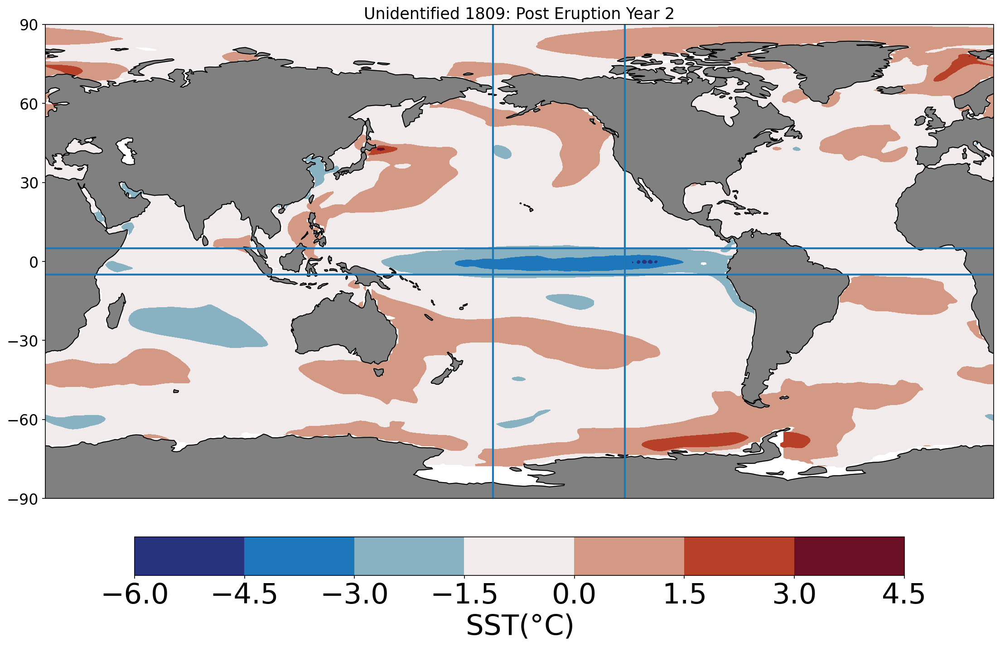

In [24]:
projection=ccrs.PlateCarree(central_longitude = -160)
fig,ax= plt.subplots(figsize =(18,15),subplot_kw=dict(projection=projection))

ax.add_feature(cfeature.LAND, color = 'gray')
ax.add_feature(cfeature.COASTLINE)
ax.set_global()


p = plt.contourf(new_lons,new_lats, plot_data,
                transform=ccrs.PlateCarree(),cmap= 'cmo.balance',zorder=-1) #'cmo.balance' or 'coolwarm'
ax.set_yticks([-90, -60, -30, 0, 30, 60, 90], crs=projection)
plt.axhline(y=5)
plt.axhline(y=-5)
plt.axvline(x=-10)
plt.axvline(x=40)
plt.title('Unidentified 1809: Post Eruption Year 2')
cbar = plt.colorbar(p, orientation='horizontal', pad=0.05, fraction=0.05,ax=ax)
cbar.ax.tick_params(labelsize=30)
cbar.set_label('SST' + "($\degree$C)", size = 30)

#### Year 3

In [72]:
unident3_post_3yr_anomaly = unident3_post_3yr-monthlydata

In [73]:
from scipy.ndimage import uniform_filter1d

def rolling_mean(a, W, axis=-1):
    # a : Input ndarray
    # W : Window size
    # axis : Axis along which we will apply rolling/sliding mean
    hW = W//2
    L = a.shape[axis]-W+1   
    indexer = [slice(None) for _ in range(a.ndim)]
    indexer[axis] = slice(hW,hW+L)
    return uniform_filter1d(a,W,axis=axis)[tuple(indexer)]

def ENSO_area_mean(var):  
    # assumes 2D field as var input
    # make sure masking is correct, otherwise we get nans
    var = np.ma.masked_invalid(var)
    # resulting variable should have dimensions of depth and time (x)
    ave = np.zeros(var.shape[0])
    # loop over time
    for t in np.arange(var.shape[0]):
        ave[t] = np.ma.average(var[t,167:206,203:248])
    return ave

In [74]:
unident3_post_3yr_rm=rolling_mean(unident3_post_3yr_anomaly['TEMP'][:,0,:,:],5,axis=0)

/glade/u/ssg/ch/usr/jupyterhub/envs/npl-3.7.9/dav/lib/python3.7/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


In [75]:
ENSO_area_mean(unident3_post_3yr_rm)

array([-0.84683445, -0.38688054,  0.1177251 ,  0.61936571,  1.07511025,
        1.41076417,  1.36219646,  0.86722659])

In [76]:
plot_data,new_lats,new_lons = pop_add_cyclic(unident3_post_3yr_rm[0],data['TLAT'],data['TLONG'])

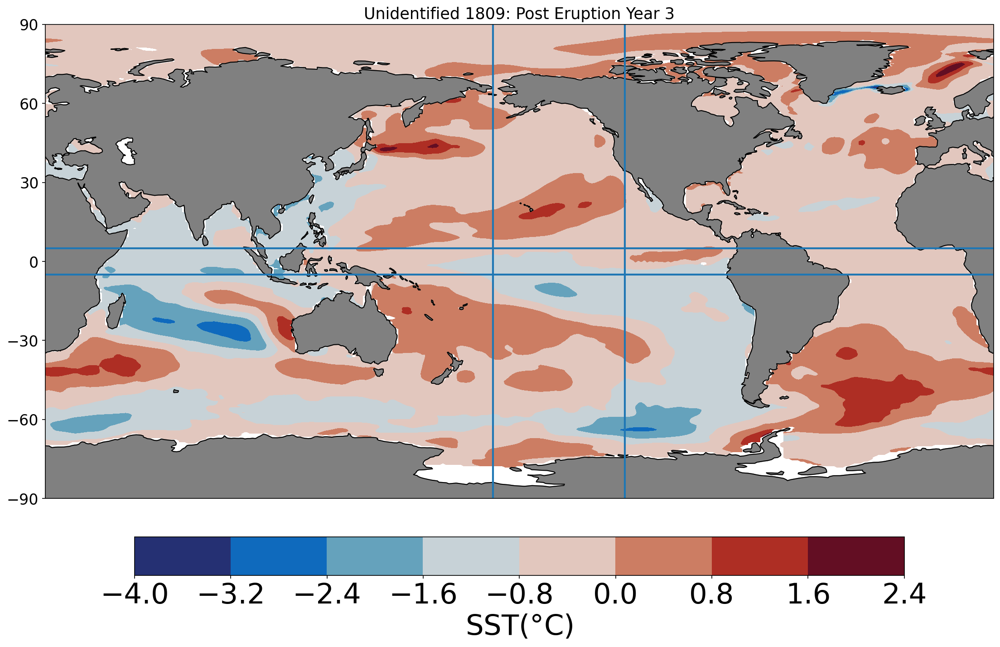

In [79]:
projection=ccrs.PlateCarree(central_longitude = -160)
fig,ax= plt.subplots(figsize =(18,15),subplot_kw=dict(projection=projection))

ax.add_feature(cfeature.LAND, color = 'gray')
ax.add_feature(cfeature.COASTLINE)
ax.set_global()


p = plt.contourf(new_lons,new_lats, plot_data,
                transform=ccrs.PlateCarree(),cmap= 'cmo.balance',zorder=-1) #'cmo.balance' or 'coolwarm'
ax.set_yticks([-90, -60, -30, 0, 30, 60, 90], crs=projection)
plt.axhline(y=5)
plt.axhline(y=-5)
plt.axvline(x=-10)
plt.axvline(x=40)
plt.title('Unidentified 1809: Post Eruption Year 3')
cbar = plt.colorbar(p, orientation='horizontal', pad=0.05, fraction=0.05,ax=ax)
cbar.ax.tick_params(labelsize=30)
cbar.set_label('SST' + "($\degree$C)", size = 30)

### Unidentified_4 1108: Post Eruption Years

In [80]:
unident4_post_1yr = data.sel(time=slice('1108-02-01 00:00:00','1109-02-01 00:00:00')).groupby('time.month').mean(dim='time')
unident4_post_2yr = data.sel(time=slice('1110-02-01 00:00:00','1111-02-01 00:00:00')).groupby('time.month').mean(dim='time')
unident4_post_3yr = data.sel(time=slice('1112-02-01 00:00:00','1113-02-01 00:00:00')).groupby('time.month').mean(dim='time')

#### Year 1

In [81]:
unident4_post_1yr_anomaly = unident4_post_1yr-monthlydata

In [82]:
from scipy.ndimage import uniform_filter1d

def rolling_mean(a, W, axis=-1):
    # a : Input ndarray
    # W : Window size
    # axis : Axis along which we will apply rolling/sliding mean
    hW = W//2
    L = a.shape[axis]-W+1   
    indexer = [slice(None) for _ in range(a.ndim)]
    indexer[axis] = slice(hW,hW+L)
    return uniform_filter1d(a,W,axis=axis)[tuple(indexer)]

def ENSO_area_mean(var):  
    # assumes 2D field as var input
    # make sure masking is correct, otherwise we get nans
    var = np.ma.masked_invalid(var)
    # resulting variable should have dimensions of depth and time (x)
    ave = np.zeros(var.shape[0])
    # loop over time
    for t in np.arange(var.shape[0]):
        ave[t] = np.ma.average(var[t,167:206,203:248])
    return ave

In [83]:
unident4_post_1yr_rm=rolling_mean(unident4_post_1yr_anomaly['TEMP'][:,0,:,:],5,axis=0)

/glade/u/ssg/ch/usr/jupyterhub/envs/npl-3.7.9/dav/lib/python3.7/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


In [84]:
ENSO_area_mean(unident4_post_1yr_rm)

array([-1.41736584, -1.26063354, -1.07975566, -0.89688884, -0.85706603,
       -0.89437851, -1.01078802, -1.12305661])

In [85]:
plot_data,new_lats,new_lons = pop_add_cyclic(unident4_post_1yr_rm[0],data['TLAT'],data['TLONG'])

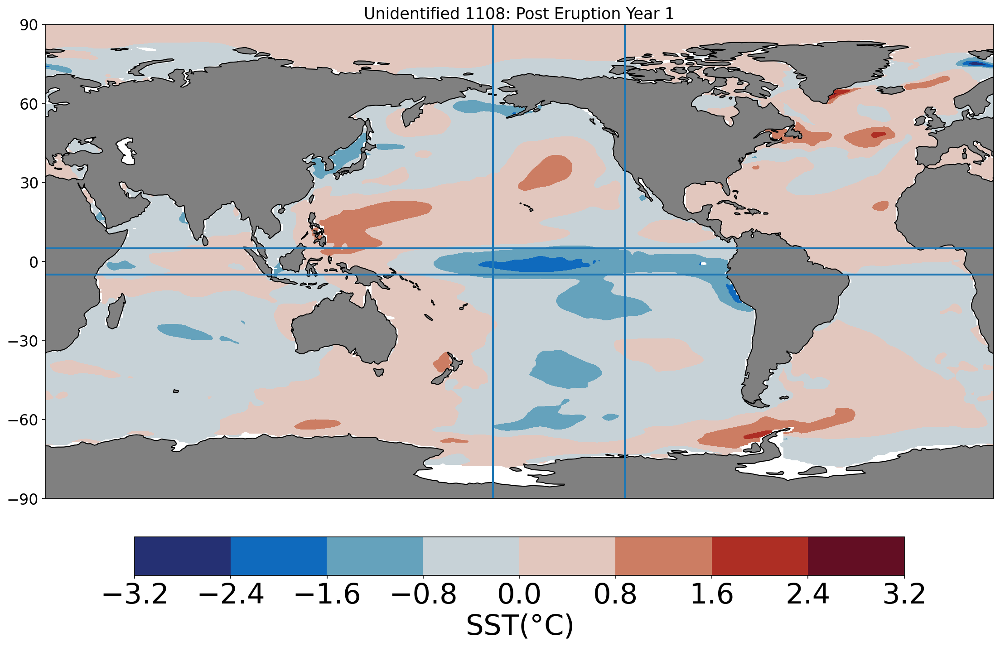

In [86]:
projection=ccrs.PlateCarree(central_longitude = -160)
fig,ax= plt.subplots(figsize =(18,15),subplot_kw=dict(projection=projection))

ax.add_feature(cfeature.LAND, color = 'gray')
ax.add_feature(cfeature.COASTLINE)
ax.set_global()


p = plt.contourf(new_lons,new_lats, plot_data,
                transform=ccrs.PlateCarree(),cmap= 'cmo.balance',zorder=-1) #'cmo.balance' or 'coolwarm'
ax.set_yticks([-90, -60, -30, 0, 30, 60, 90], crs=projection)
plt.axhline(y=5)
plt.axhline(y=-5)
plt.axvline(x=-10)
plt.axvline(x=40)
plt.title('Unidentified 1108: Post Eruption Year 1')
cbar = plt.colorbar(p, orientation='horizontal', pad=0.05, fraction=0.05,ax=ax)
cbar.ax.tick_params(labelsize=30)
cbar.set_label('SST' + "($\degree$C)", size = 30)

#### Year 2

In [87]:
unident4_post_2yr_anomaly = unident4_post_2yr-monthlydata

In [88]:
from scipy.ndimage import uniform_filter1d

def rolling_mean(a, W, axis=-1):
    # a : Input ndarray
    # W : Window size
    # axis : Axis along which we will apply rolling/sliding mean
    hW = W//2
    L = a.shape[axis]-W+1   
    indexer = [slice(None) for _ in range(a.ndim)]
    indexer[axis] = slice(hW,hW+L)
    return uniform_filter1d(a,W,axis=axis)[tuple(indexer)]

def ENSO_area_mean(var):  
    # assumes 2D field as var input
    # make sure masking is correct, otherwise we get nans
    var = np.ma.masked_invalid(var)
    # resulting variable should have dimensions of depth and time (x)
    ave = np.zeros(var.shape[0])
    # loop over time
    for t in np.arange(var.shape[0]):
        ave[t] = np.ma.average(var[t,167:206,203:248])
    return ave

In [89]:
unident4_post_2yr_rm=rolling_mean(unident4_post_2yr_anomaly['TEMP'][:,0,:,:],5,axis=0)

/glade/u/ssg/ch/usr/jupyterhub/envs/npl-3.7.9/dav/lib/python3.7/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


In [90]:
ENSO_area_mean(unident4_post_2yr_rm)

array([-0.03930042,  0.23185275,  0.14554141, -0.22963551, -0.41362047,
       -0.56642628, -0.78302374, -0.96813847])

In [91]:
plot_data,new_lats,new_lons = pop_add_cyclic(unident4_post_2yr_rm[0],data['TLAT'],data['TLONG'])

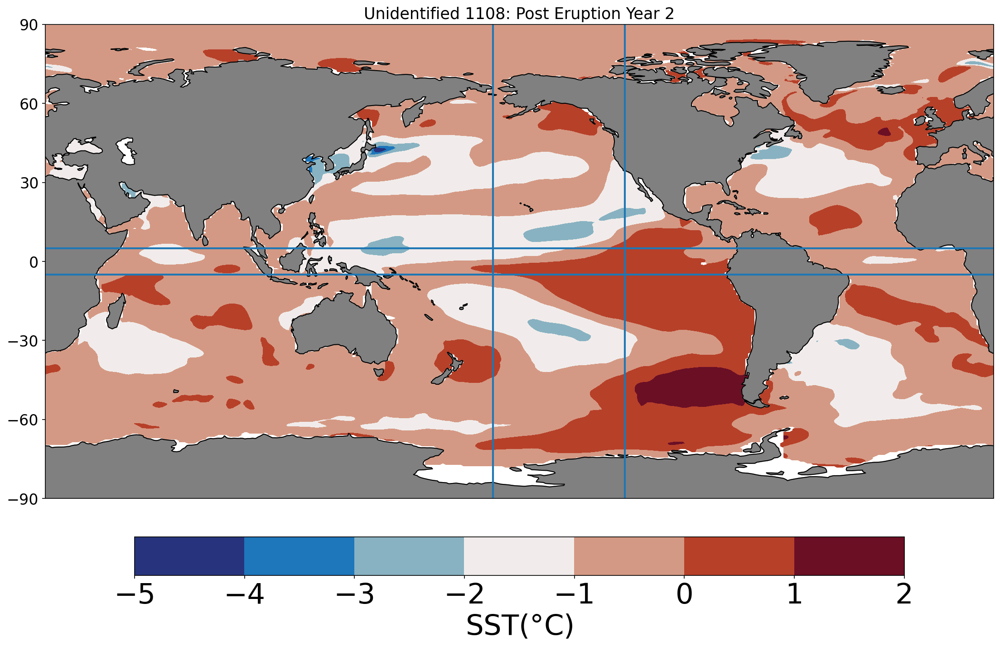

In [92]:
projection=ccrs.PlateCarree(central_longitude = -160)
fig,ax= plt.subplots(figsize =(18,15),subplot_kw=dict(projection=projection))

ax.add_feature(cfeature.LAND, color = 'gray')
ax.add_feature(cfeature.COASTLINE)
ax.set_global()


p = plt.contourf(new_lons,new_lats, plot_data,
                transform=ccrs.PlateCarree(),cmap= 'cmo.balance',zorder=-1) #'cmo.balance' or 'coolwarm'
ax.set_yticks([-90, -60, -30, 0, 30, 60, 90], crs=projection)
plt.axhline(y=5)
plt.axhline(y=-5)
plt.axvline(x=-10)
plt.axvline(x=40)
plt.title('Unidentified 1108: Post Eruption Year 2')
cbar = plt.colorbar(p, orientation='horizontal', pad=0.05, fraction=0.05,ax=ax)
cbar.ax.tick_params(labelsize=30)
cbar.set_label('SST' + "($\degree$C)", size = 30)

#### Year 3

In [93]:
unident4_post_3yr_anomaly = unident4_post_3yr-monthlydata

In [94]:
from scipy.ndimage import uniform_filter1d

def rolling_mean(a, W, axis=-1):
    # a : Input ndarray
    # W : Window size
    # axis : Axis along which we will apply rolling/sliding mean
    hW = W//2
    L = a.shape[axis]-W+1   
    indexer = [slice(None) for _ in range(a.ndim)]
    indexer[axis] = slice(hW,hW+L)
    return uniform_filter1d(a,W,axis=axis)[tuple(indexer)]

def ENSO_area_mean(var):  
    # assumes 2D field as var input
    # make sure masking is correct, otherwise we get nans
    var = np.ma.masked_invalid(var)
    # resulting variable should have dimensions of depth and time (x)
    ave = np.zeros(var.shape[0])
    # loop over time
    for t in np.arange(var.shape[0]):
        ave[t] = np.ma.average(var[t,167:206,203:248])
    return ave

In [95]:
unident4_post_3yr_rm=rolling_mean(unident4_post_3yr_anomaly['TEMP'][:,0,:,:],5,axis=0)

/glade/u/ssg/ch/usr/jupyterhub/envs/npl-3.7.9/dav/lib/python3.7/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


In [96]:
ENSO_area_mean(unident4_post_3yr_rm)

array([-1.4700678 , -1.84921861, -1.93380325, -1.72772617, -1.45765628,
       -1.10249023, -0.81827939, -0.48697002])

In [97]:
plot_data,new_lats,new_lons = pop_add_cyclic(unident4_post_3yr_rm[0],data['TLAT'],data['TLONG'])

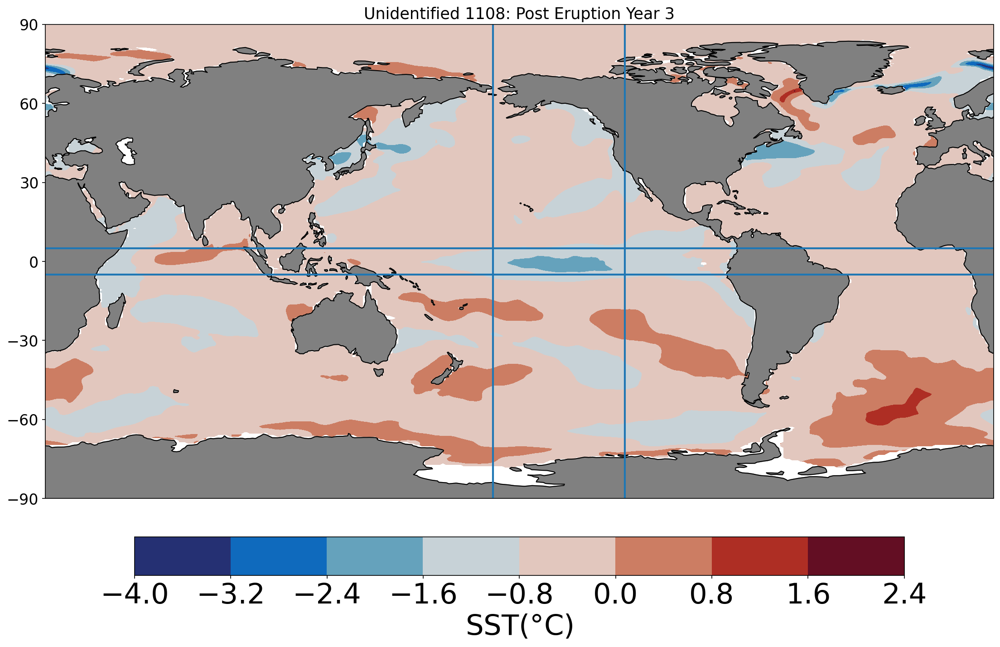

In [98]:
projection=ccrs.PlateCarree(central_longitude = -160)
fig,ax= plt.subplots(figsize =(18,15),subplot_kw=dict(projection=projection))

ax.add_feature(cfeature.LAND, color = 'gray')
ax.add_feature(cfeature.COASTLINE)
ax.set_global()


p = plt.contourf(new_lons,new_lats, plot_data,
                transform=ccrs.PlateCarree(),cmap= 'cmo.balance',zorder=-1) #'cmo.balance' or 'coolwarm'
ax.set_yticks([-90, -60, -30, 0, 30, 60, 90], crs=projection)
plt.axhline(y=5)
plt.axhline(y=-5)
plt.axvline(x=-10)
plt.axvline(x=40)
plt.title('Unidentified 1108: Post Eruption Year 3')
cbar = plt.colorbar(p, orientation='horizontal', pad=0.05, fraction=0.05,ax=ax)
cbar.ax.tick_params(labelsize=30)
cbar.set_label('SST' + "($\degree$C)", size = 30)

### Huaynaputina 1600: Post Eruption Years

In [12]:
huay_post_1yr = data.sel(time=slice('1600-03-01 00:00:00','1601-03-01 00:00:00')).groupby('time.month').mean(dim='time')
huay_post_2yr = data.sel(time=slice('1601-03-01 00:00:00','1602-03-01 00:00:00')).groupby('time.month').mean(dim='time')
huay_post_3yr = data.sel(time=slice('1602-03-01 00:00:00','1603-03-01 00:00:00')).groupby('time.month').mean(dim='time')

#### Year 1

In [100]:
huay_post_1yr_anomaly = huay_post_1yr-monthlydata

In [101]:
from scipy.ndimage import uniform_filter1d

def rolling_mean(a, W, axis=-1):
    # a : Input ndarray
    # W : Window size
    # axis : Axis along which we will apply rolling/sliding mean
    hW = W//2
    L = a.shape[axis]-W+1   
    indexer = [slice(None) for _ in range(a.ndim)]
    indexer[axis] = slice(hW,hW+L)
    return uniform_filter1d(a,W,axis=axis)[tuple(indexer)]

def ENSO_area_mean(var):  
    # assumes 2D field as var input
    # make sure masking is correct, otherwise we get nans
    var = np.ma.masked_invalid(var)
    # resulting variable should have dimensions of depth and time (x)
    ave = np.zeros(var.shape[0])
    # loop over time
    for t in np.arange(var.shape[0]):
        ave[t] = np.ma.average(var[t,167:206,203:248])
    return ave

In [102]:
huay_post_1yr_rm=rolling_mean(huay_post_1yr_anomaly['TEMP'][:,0,:,:],5,axis=0)

/glade/u/ssg/ch/usr/jupyterhub/envs/npl-3.7.9/dav/lib/python3.7/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


In [103]:
ENSO_area_mean(huay_post_1yr_rm)

array([-0.77208388, -0.68808587, -0.61778568, -0.53601419, -0.5597097 ,
       -0.67576497, -0.78352586, -0.85324631])

In [104]:
plot_data,new_lats,new_lons = pop_add_cyclic(huay_post_1yr_rm[0],data['TLAT'],data['TLONG'])

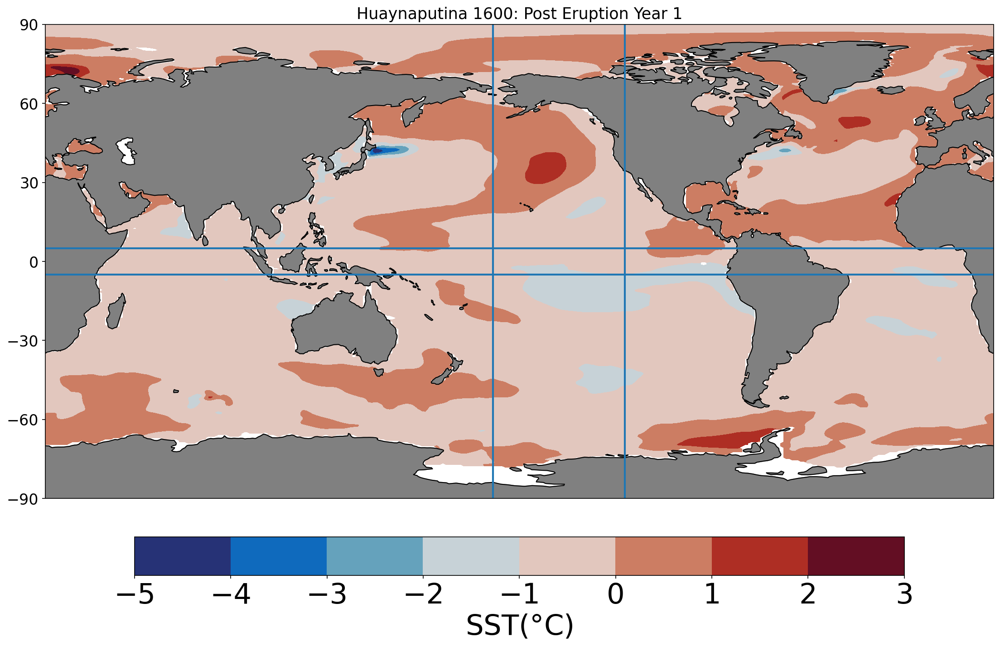

In [105]:
projection=ccrs.PlateCarree(central_longitude = -160)
fig,ax= plt.subplots(figsize =(18,15),subplot_kw=dict(projection=projection))

ax.add_feature(cfeature.LAND, color = 'gray')
ax.add_feature(cfeature.COASTLINE)
ax.set_global()


p = plt.contourf(new_lons,new_lats, plot_data,
                transform=ccrs.PlateCarree(),cmap= 'cmo.balance',zorder=-1) #'cmo.balance' or 'coolwarm'
ax.set_yticks([-90, -60, -30, 0, 30, 60, 90], crs=projection)
plt.axhline(y=5)
plt.axhline(y=-5)
plt.axvline(x=-10)
plt.axvline(x=40)
plt.title('Huaynaputina 1600: Post Eruption Year 1')
cbar = plt.colorbar(p, orientation='horizontal', pad=0.05, fraction=0.05,ax=ax)
cbar.ax.tick_params(labelsize=30)
cbar.set_label('SST' + "($\degree$C)", size = 30)

#### Year 2

In [106]:
huay_post_2yr_anomaly = huay_post_2yr-monthlydata

In [107]:
from scipy.ndimage import uniform_filter1d

def rolling_mean(a, W, axis=-1):
    # a : Input ndarray
    # W : Window size
    # axis : Axis along which we will apply rolling/sliding mean
    hW = W//2
    L = a.shape[axis]-W+1   
    indexer = [slice(None) for _ in range(a.ndim)]
    indexer[axis] = slice(hW,hW+L)
    return uniform_filter1d(a,W,axis=axis)[tuple(indexer)]

def ENSO_area_mean(var):  
    # assumes 2D field as var input
    # make sure masking is correct, otherwise we get nans
    var = np.ma.masked_invalid(var)
    # resulting variable should have dimensions of depth and time (x)
    ave = np.zeros(var.shape[0])
    # loop over time
    for t in np.arange(var.shape[0]):
        ave[t] = np.ma.average(var[t,167:206,203:248])
    return ave

In [108]:
huay_post_2yr_rm=rolling_mean(huay_post_2yr_anomaly['TEMP'][:,0,:,:],5,axis=0)

/glade/u/ssg/ch/usr/jupyterhub/envs/npl-3.7.9/dav/lib/python3.7/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


In [109]:
ENSO_area_mean(huay_post_2yr_rm)

array([1.27263775, 0.96710939, 0.6972129 , 0.8410993 , 1.20343452,
       1.48648782, 1.79676844, 2.0330042 ])

In [110]:
plot_data,new_lats,new_lons = pop_add_cyclic(huay_post_2yr_rm[0],data['TLAT'],data['TLONG'])

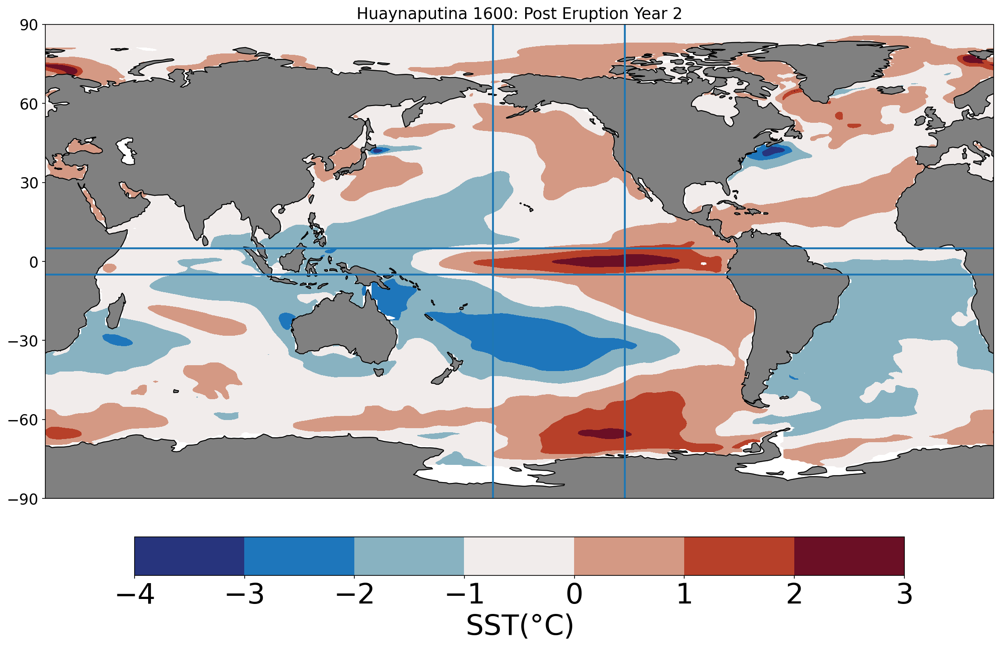

In [111]:
projection=ccrs.PlateCarree(central_longitude = -160)
fig,ax= plt.subplots(figsize =(18,15),subplot_kw=dict(projection=projection))

ax.add_feature(cfeature.LAND, color = 'gray')
ax.add_feature(cfeature.COASTLINE)
ax.set_global()


p = plt.contourf(new_lons,new_lats, plot_data,
                transform=ccrs.PlateCarree(),cmap= 'cmo.balance',zorder=-1) #'cmo.balance' or 'coolwarm'
ax.set_yticks([-90, -60, -30, 0, 30, 60, 90], crs=projection)
plt.axhline(y=5)
plt.axhline(y=-5)
plt.axvline(x=-10)
plt.axvline(x=40)
plt.title('Huaynaputina 1600: Post Eruption Year 2')
cbar = plt.colorbar(p, orientation='horizontal', pad=0.05, fraction=0.05,ax=ax)
cbar.ax.tick_params(labelsize=30)
cbar.set_label('SST' + "($\degree$C)", size = 30)

#### Year 3

In [13]:
huay_post_3yr_anomaly = huay_post_3yr-monthlydata

In [14]:
from scipy.ndimage import uniform_filter1d

def rolling_mean(a, W, axis=-1):
    # a : Input ndarray
    # W : Window size
    # axis : Axis along which we will apply rolling/sliding mean
    hW = W//2
    L = a.shape[axis]-W+1   
    indexer = [slice(None) for _ in range(a.ndim)]
    indexer[axis] = slice(hW,hW+L)
    return uniform_filter1d(a,W,axis=axis)[tuple(indexer)]

def ENSO_area_mean(var):  
    # assumes 2D field as var input
    # make sure masking is correct, otherwise we get nans
    var = np.ma.masked_invalid(var)
    # resulting variable should have dimensions of depth and time (x)
    ave = np.zeros(var.shape[0])
    # loop over time
    for t in np.arange(var.shape[0]):
        ave[t] = np.ma.average(var[t,167:206,203:248])
    return ave

In [15]:
huay_post_3yr_rm=rolling_mean(huay_post_3yr_anomaly['TEMP'][:,0,:,:],5,axis=0)

/glade/u/ssg/ch/usr/jupyterhub/envs/npl-3.7.9/dav/lib/python3.7/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


In [16]:
ENSO_area_mean(huay_post_3yr_rm)

array([-0.47046674,  0.19651449,  0.83711466,  0.94506279,  0.52894906,
        0.11402537, -0.32884688, -0.98297665])

In [17]:
plot_data,new_lats,new_lons = pop_add_cyclic(huay_post_3yr_rm[0],data['TLAT'],data['TLONG'])

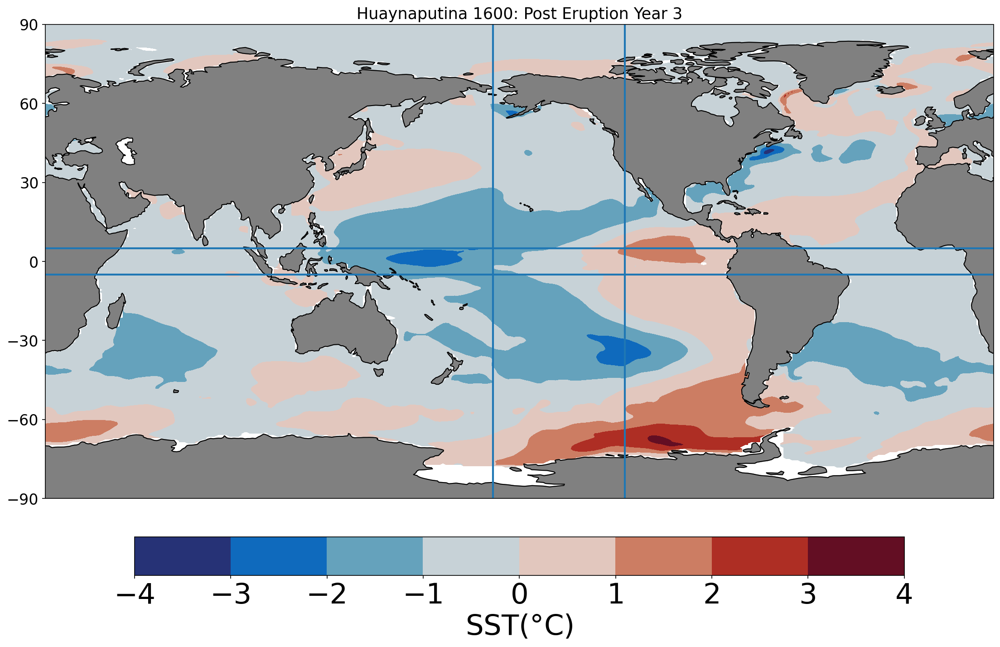

In [18]:
projection=ccrs.PlateCarree(central_longitude = -160)
fig,ax= plt.subplots(figsize =(18,15),subplot_kw=dict(projection=projection))

ax.add_feature(cfeature.LAND, color = 'gray')
ax.add_feature(cfeature.COASTLINE)
ax.set_global()


p = plt.contourf(new_lons,new_lats, plot_data,
                transform=ccrs.PlateCarree(),cmap= 'cmo.balance',zorder=-1) #'cmo.balance' or 'coolwarm'
ax.set_yticks([-90, -60, -30, 0, 30, 60, 90], crs=projection)
plt.axhline(y=5)
plt.axhline(y=-5)
plt.axvline(x=-10)
plt.axvline(x=40)
plt.title('Huaynaputina 1600: Post Eruption Year 3')
cbar = plt.colorbar(p, orientation='horizontal', pad=0.05, fraction=0.05,ax=ax)
cbar.ax.tick_params(labelsize=30)
cbar.set_label('SST' + "($\degree$C)", size = 30)

### Parker 1640: Post Eruption Years

In [20]:
parker_post_1yr = data.sel(time=slice('1641-01-01 00:00:00','1642-01-01 00:00:00')).groupby('time.month').mean(dim='time')
parker_post_2yr = data.sel(time=slice('1642-01-01 00:00:00','1643-01-01 00:00:00')).groupby('time.month').mean(dim='time')
parker_post_3yr = data.sel(time=slice('1643-01-01 00:00:00','1644-01-01 00:00:00')).groupby('time.month').mean(dim='time')

#### Year 1

In [21]:
parker_post_1yr_anomaly = parker_post_1yr-monthlydata

In [22]:
from scipy.ndimage import uniform_filter1d

def rolling_mean(a, W, axis=-1):
    # a : Input ndarray
    # W : Window size
    # axis : Axis along which we will apply rolling/sliding mean
    hW = W//2
    L = a.shape[axis]-W+1   
    indexer = [slice(None) for _ in range(a.ndim)]
    indexer[axis] = slice(hW,hW+L)
    return uniform_filter1d(a,W,axis=axis)[tuple(indexer)]

def ENSO_area_mean(var):  
    # assumes 2D field as var input
    # make sure masking is correct, otherwise we get nans
    var = np.ma.masked_invalid(var)
    # resulting variable should have dimensions of depth and time (x)
    ave = np.zeros(var.shape[0])
    # loop over time
    for t in np.arange(var.shape[0]):
        ave[t] = np.ma.average(var[t,167:206,203:248])
    return ave

In [23]:
parker_post_1yr_rm=rolling_mean(parker_post_1yr_anomaly['TEMP'][:,0,:,:],5,axis=0)

/glade/u/ssg/ch/usr/jupyterhub/envs/npl-3.7.9/dav/lib/python3.7/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


In [24]:
ENSO_area_mean(parker_post_1yr_rm)

array([-0.38068062, -0.57746339, -0.38224054, -0.06969709,  0.32011242,
        0.72932734,  1.1926705 ,  1.52333344])

In [25]:
plot_data,new_lats,new_lons = pop_add_cyclic(parker_post_1yr_rm[0],data['TLAT'],data['TLONG'])

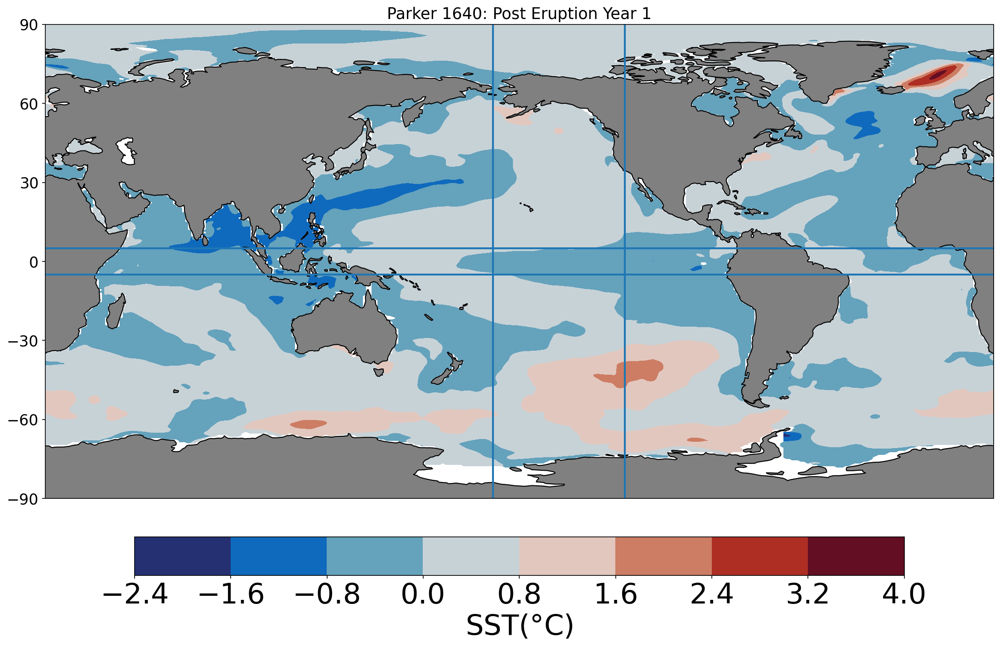

In [26]:
projection=ccrs.PlateCarree(central_longitude = -160)
fig,ax= plt.subplots(figsize =(18,15),subplot_kw=dict(projection=projection))

ax.add_feature(cfeature.LAND, color = 'gray')
ax.add_feature(cfeature.COASTLINE)
ax.set_global()


p = plt.contourf(new_lons,new_lats, plot_data,
                transform=ccrs.PlateCarree(),cmap= 'cmo.balance',zorder=-1) #'cmo.balance' or 'coolwarm'
ax.set_yticks([-90, -60, -30, 0, 30, 60, 90], crs=projection)
plt.axhline(y=5)
plt.axhline(y=-5)
plt.axvline(x=-10)
plt.axvline(x=40)
plt.title('Parker 1640: Post Eruption Year 1')
cbar = plt.colorbar(p, orientation='horizontal', pad=0.05, fraction=0.05,ax=ax)
cbar.ax.tick_params(labelsize=30)
cbar.set_label('SST' + "($\degree$C)", size = 30)

#### Year 2

In [27]:
parker_post_2yr_anomaly = parker_post_2yr-monthlydata

In [28]:
from scipy.ndimage import uniform_filter1d

def rolling_mean(a, W, axis=-1):
    # a : Input ndarray
    # W : Window size
    # axis : Axis along which we will apply rolling/sliding mean
    hW = W//2
    L = a.shape[axis]-W+1   
    indexer = [slice(None) for _ in range(a.ndim)]
    indexer[axis] = slice(hW,hW+L)
    return uniform_filter1d(a,W,axis=axis)[tuple(indexer)]

def ENSO_area_mean(var):  
    # assumes 2D field as var input
    # make sure masking is correct, otherwise we get nans
    var = np.ma.masked_invalid(var)
    # resulting variable should have dimensions of depth and time (x)
    ave = np.zeros(var.shape[0])
    # loop over time
    for t in np.arange(var.shape[0]):
        ave[t] = np.ma.average(var[t,167:206,203:248])
    return ave

In [29]:
parker_post_2yr_rm=rolling_mean(parker_post_2yr_anomaly['TEMP'][:,0,:,:],5,axis=0)

/glade/u/ssg/ch/usr/jupyterhub/envs/npl-3.7.9/dav/lib/python3.7/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


In [30]:
ENSO_area_mean(parker_post_2yr_rm)

array([1.41992744, 1.34423939, 1.0533955 , 0.78019004, 0.54731543,
       0.33637654, 0.2120254 , 0.03330123])

In [31]:
plot_data,new_lats,new_lons = pop_add_cyclic(parker_post_2yr_rm[0],data['TLAT'],data['TLONG'])

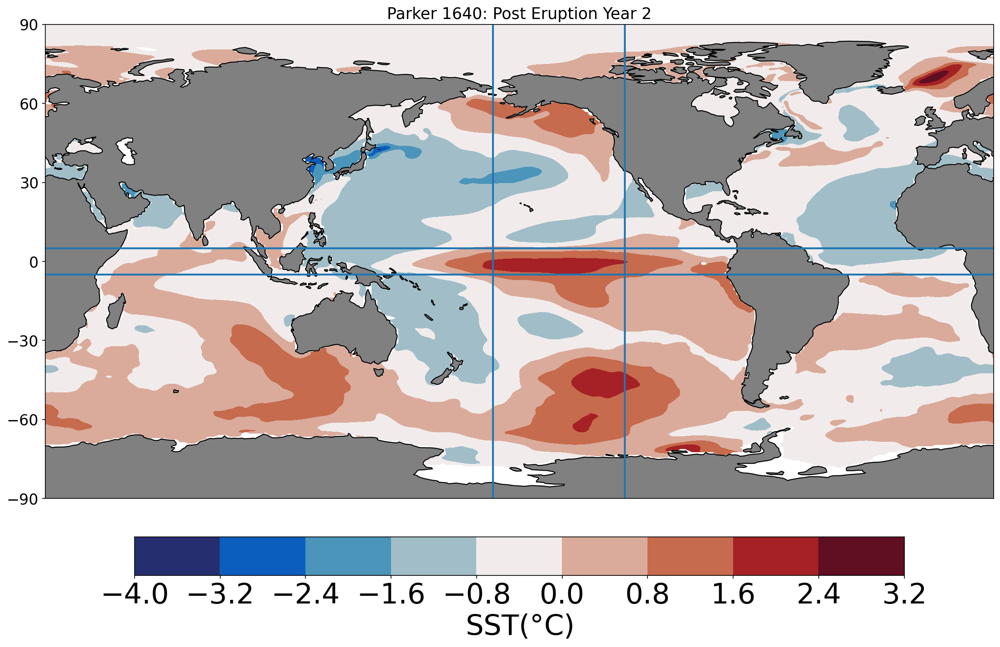

In [32]:
projection=ccrs.PlateCarree(central_longitude = -160)
fig,ax= plt.subplots(figsize =(18,15),subplot_kw=dict(projection=projection))

ax.add_feature(cfeature.LAND, color = 'gray')
ax.add_feature(cfeature.COASTLINE)
ax.set_global()


p = plt.contourf(new_lons,new_lats, plot_data,
                transform=ccrs.PlateCarree(),cmap= 'cmo.balance',zorder=-1) #'cmo.balance' or 'coolwarm'
ax.set_yticks([-90, -60, -30, 0, 30, 60, 90], crs=projection)
plt.axhline(y=5)
plt.axhline(y=-5)
plt.axvline(x=-10)
plt.axvline(x=40)
plt.title('Parker 1640: Post Eruption Year 2')
cbar = plt.colorbar(p, orientation='horizontal', pad=0.05, fraction=0.05,ax=ax)
cbar.ax.tick_params(labelsize=30)
cbar.set_label('SST' + "($\degree$C)", size = 30)

#### Year 3

In [33]:
parker_post_3yr_anomaly = parker_post_3yr-monthlydata

In [34]:
from scipy.ndimage import uniform_filter1d

def rolling_mean(a, W, axis=-1):
    # a : Input ndarray
    # W : Window size
    # axis : Axis along which we will apply rolling/sliding mean
    hW = W//2
    L = a.shape[axis]-W+1   
    indexer = [slice(None) for _ in range(a.ndim)]
    indexer[axis] = slice(hW,hW+L)
    return uniform_filter1d(a,W,axis=axis)[tuple(indexer)]

def ENSO_area_mean(var):  
    # assumes 2D field as var input
    # make sure masking is correct, otherwise we get nans
    var = np.ma.masked_invalid(var)
    # resulting variable should have dimensions of depth and time (x)
    ave = np.zeros(var.shape[0])
    # loop over time
    for t in np.arange(var.shape[0]):
        ave[t] = np.ma.average(var[t,167:206,203:248])
    return ave

In [35]:
parker_post_3yr_rm=rolling_mean(parker_post_3yr_anomaly['TEMP'][:,0,:,:],5,axis=0)

/glade/u/ssg/ch/usr/jupyterhub/envs/npl-3.7.9/dav/lib/python3.7/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


In [36]:
ENSO_area_mean(parker_post_3yr_rm)

array([-1.23343488, -1.45612967, -1.75718316, -1.92361389, -1.85451375,
       -1.73189075, -1.61176382, -1.50628116])

In [37]:
plot_data,new_lats,new_lons = pop_add_cyclic(parker_post_3yr_rm[0],data['TLAT'],data['TLONG'])

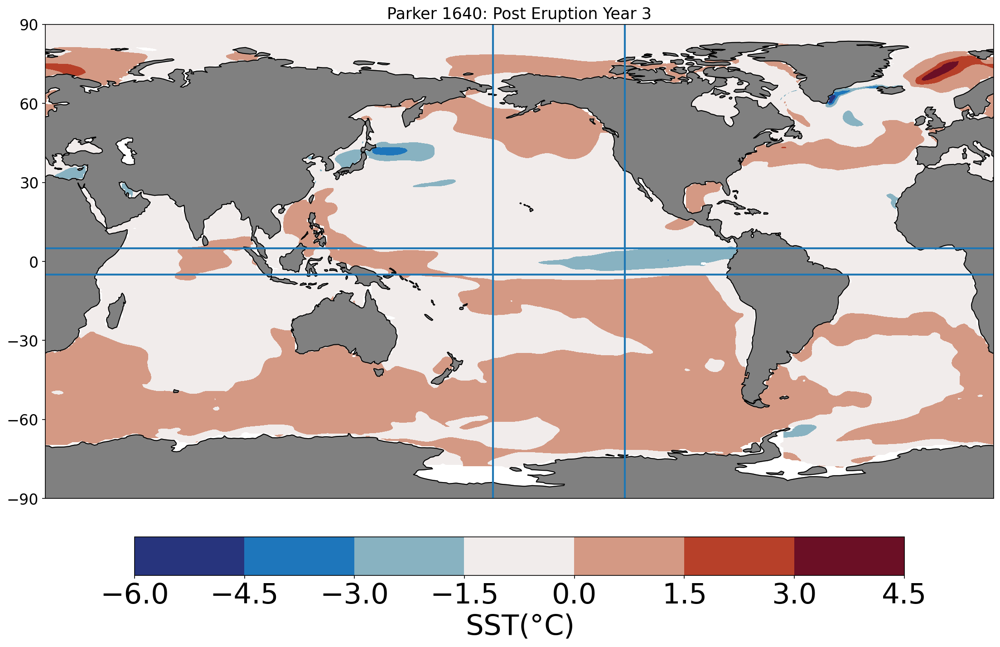

In [38]:
projection=ccrs.PlateCarree(central_longitude = -160)
fig,ax= plt.subplots(figsize =(18,15),subplot_kw=dict(projection=projection))

ax.add_feature(cfeature.LAND, color = 'gray')
ax.add_feature(cfeature.COASTLINE)
ax.set_global()


p = plt.contourf(new_lons,new_lats, plot_data,
                transform=ccrs.PlateCarree(),cmap= 'cmo.balance',zorder=-1) #'cmo.balance' or 'coolwarm'
ax.set_yticks([-90, -60, -30, 0, 30, 60, 90], crs=projection)
plt.axhline(y=5)
plt.axhline(y=-5)
plt.axvline(x=-10)
plt.axvline(x=40)
plt.title('Parker 1640: Post Eruption Year 3')
cbar = plt.colorbar(p, orientation='horizontal', pad=0.05, fraction=0.05,ax=ax)
cbar.ax.tick_params(labelsize=30)
cbar.set_label('SST' + "($\degree$C)", size = 30)

### Unidentified_5 1171: Post Eruption Years

In [25]:
unident5_post_1yr = data.sel(time=slice('1171-02-01 00:00:00','1172-02-01 00:00:00')).groupby('time.month').mean(dim='time')
unident5_post_2yr = data.sel(time=slice('1172-02-01 00:00:00','1173-02-01 00:00:00')).groupby('time.month').mean(dim='time')
unident5_post_3yr = data.sel(time=slice('1173-02-01 00:00:00','1174-02-01 00:00:00')).groupby('time.month').mean(dim='time')

#### Year 1

In [40]:
unident5_post_1yr_anomaly = unident5_post_1yr-monthlydata

In [41]:
from scipy.ndimage import uniform_filter1d

def rolling_mean(a, W, axis=-1):
    # a : Input ndarray
    # W : Window size
    # axis : Axis along which we will apply rolling/sliding mean
    hW = W//2
    L = a.shape[axis]-W+1   
    indexer = [slice(None) for _ in range(a.ndim)]
    indexer[axis] = slice(hW,hW+L)
    return uniform_filter1d(a,W,axis=axis)[tuple(indexer)]

def ENSO_area_mean(var):  
    # assumes 2D field as var input
    # make sure masking is correct, otherwise we get nans
    var = np.ma.masked_invalid(var)
    # resulting variable should have dimensions of depth and time (x)
    ave = np.zeros(var.shape[0])
    # loop over time
    for t in np.arange(var.shape[0]):
        ave[t] = np.ma.average(var[t,167:206,203:248])
    return ave

In [42]:
unident5_post_1yr_rm=rolling_mean(unident5_post_1yr_anomaly['TEMP'][:,0,:,:],5,axis=0)

/glade/u/ssg/ch/usr/jupyterhub/envs/npl-3.7.9/dav/lib/python3.7/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


In [43]:
ENSO_area_mean(unident5_post_1yr_rm)

array([-0.53976021, -0.76019228, -0.80957226, -0.63623381, -0.34126276,
       -0.02702164,  0.23822832,  0.4035759 ])

In [44]:
plot_data,new_lats,new_lons = pop_add_cyclic(unident5_post_1yr_rm[0],data['TLAT'],data['TLONG'])

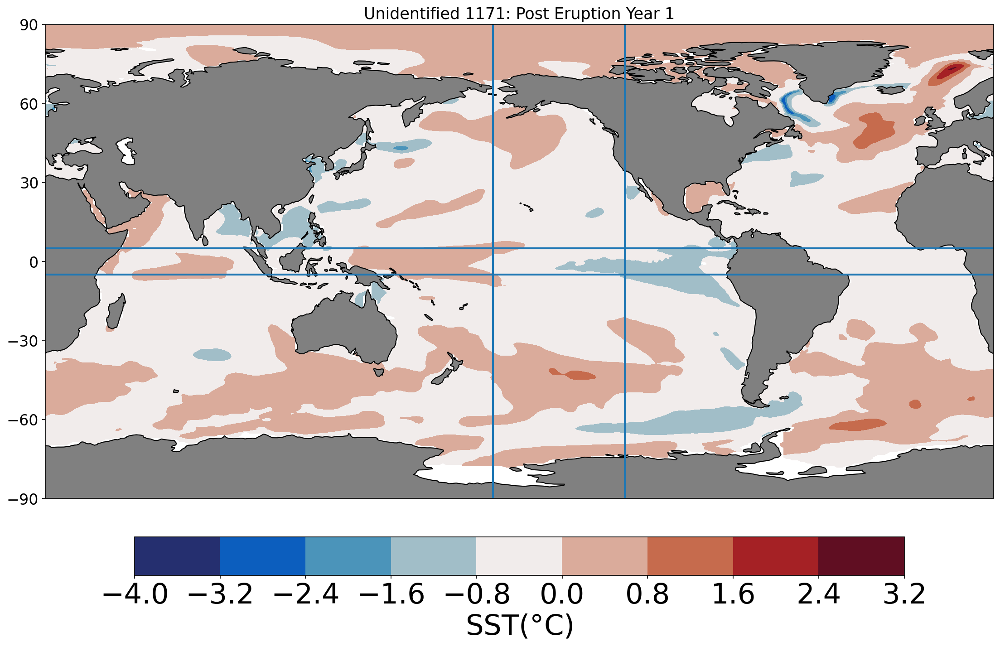

In [45]:
projection=ccrs.PlateCarree(central_longitude = -160)
fig,ax= plt.subplots(figsize =(18,15),subplot_kw=dict(projection=projection))

ax.add_feature(cfeature.LAND, color = 'gray')
ax.add_feature(cfeature.COASTLINE)
ax.set_global()


p = plt.contourf(new_lons,new_lats, plot_data,
                transform=ccrs.PlateCarree(),cmap= 'cmo.balance',zorder=-1) #'cmo.balance' or 'coolwarm'
ax.set_yticks([-90, -60, -30, 0, 30, 60, 90], crs=projection)
plt.axhline(y=5)
plt.axhline(y=-5)
plt.axvline(x=-10)
plt.axvline(x=40)
plt.title('Unidentified 1171: Post Eruption Year 1')
cbar = plt.colorbar(p, orientation='horizontal', pad=0.05, fraction=0.05,ax=ax)
cbar.ax.tick_params(labelsize=30)
cbar.set_label('SST' + "($\degree$C)", size = 30)

#### Year 2

In [26]:
unident5_post_2yr_anomaly = unident5_post_2yr-monthlydata

In [27]:
from scipy.ndimage import uniform_filter1d

def rolling_mean(a, W, axis=-1):
    # a : Input ndarray
    # W : Window size
    # axis : Axis along which we will apply rolling/sliding mean
    hW = W//2
    L = a.shape[axis]-W+1   
    indexer = [slice(None) for _ in range(a.ndim)]
    indexer[axis] = slice(hW,hW+L)
    return uniform_filter1d(a,W,axis=axis)[tuple(indexer)]

def ENSO_area_mean(var):  
    # assumes 2D field as var input
    # make sure masking is correct, otherwise we get nans
    var = np.ma.masked_invalid(var)
    # resulting variable should have dimensions of depth and time (x)
    ave = np.zeros(var.shape[0])
    # loop over time
    for t in np.arange(var.shape[0]):
        ave[t] = np.ma.average(var[t,167:206,203:248])
    return ave

In [28]:
unident5_post_2yr_rm=rolling_mean(unident5_post_2yr_anomaly['TEMP'][:,0,:,:],5,axis=0)

/glade/u/ssg/ch/usr/jupyterhub/envs/npl-3.7.9/dav/lib/python3.7/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


In [29]:
ENSO_area_mean(unident5_post_2yr_rm)

array([-0.39664995, -0.26266836, -0.36523688, -0.63263054, -0.90270001,
       -1.11643345, -1.12580219, -1.16312753])

In [30]:
plot_data,new_lats,new_lons = pop_add_cyclic(unident5_post_2yr_rm[0],data['TLAT'],data['TLONG'])

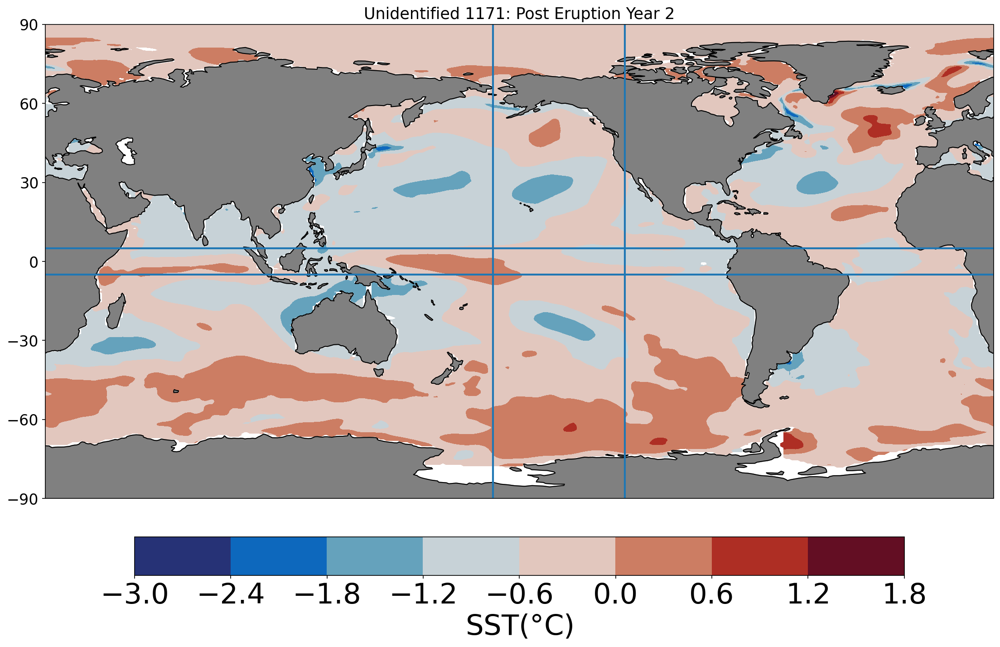

In [31]:
projection=ccrs.PlateCarree(central_longitude = -160)
fig,ax= plt.subplots(figsize =(18,15),subplot_kw=dict(projection=projection))

ax.add_feature(cfeature.LAND, color = 'gray')
ax.add_feature(cfeature.COASTLINE)
ax.set_global()


p = plt.contourf(new_lons,new_lats, plot_data,
                transform=ccrs.PlateCarree(),cmap= 'cmo.balance',zorder=-1) #'cmo.balance' or 'coolwarm'
ax.set_yticks([-90, -60, -30, 0, 30, 60, 90], crs=projection)
plt.axhline(y=5)
plt.axhline(y=-5)
plt.axvline(x=-10)
plt.axvline(x=40)
plt.title('Unidentified 1171: Post Eruption Year 2')
cbar = plt.colorbar(p, orientation='horizontal', pad=0.05, fraction=0.05,ax=ax)
cbar.ax.tick_params(labelsize=30)
cbar.set_label('SST' + "($\degree$C)", size = 30)

#### Year 3

In [32]:
unident5_post_3yr_anomaly = unident5_post_3yr-monthlydata

In [33]:
from scipy.ndimage import uniform_filter1d

def rolling_mean(a, W, axis=-1):
    # a : Input ndarray
    # W : Window size
    # axis : Axis along which we will apply rolling/sliding mean
    hW = W//2
    L = a.shape[axis]-W+1   
    indexer = [slice(None) for _ in range(a.ndim)]
    indexer[axis] = slice(hW,hW+L)
    return uniform_filter1d(a,W,axis=axis)[tuple(indexer)]

def ENSO_area_mean(var):  
    # assumes 2D field as var input
    # make sure masking is correct, otherwise we get nans
    var = np.ma.masked_invalid(var)
    # resulting variable should have dimensions of depth and time (x)
    ave = np.zeros(var.shape[0])
    # loop over time
    for t in np.arange(var.shape[0]):
        ave[t] = np.ma.average(var[t,167:206,203:248])
    return ave

In [34]:
unident5_post_3yr_rm=rolling_mean(unident5_post_3yr_anomaly['TEMP'][:,0,:,:],5,axis=0)

/glade/u/ssg/ch/usr/jupyterhub/envs/npl-3.7.9/dav/lib/python3.7/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


In [35]:
ENSO_area_mean(unident5_post_3yr_rm)

array([-0.61444728, -0.80147709, -0.77466474, -0.50216416, -0.24806743,
       -0.04787419,  0.10472327,  0.21383297])

In [36]:
plot_data,new_lats,new_lons = pop_add_cyclic(unident5_post_3yr_rm[0],data['TLAT'],data['TLONG'])

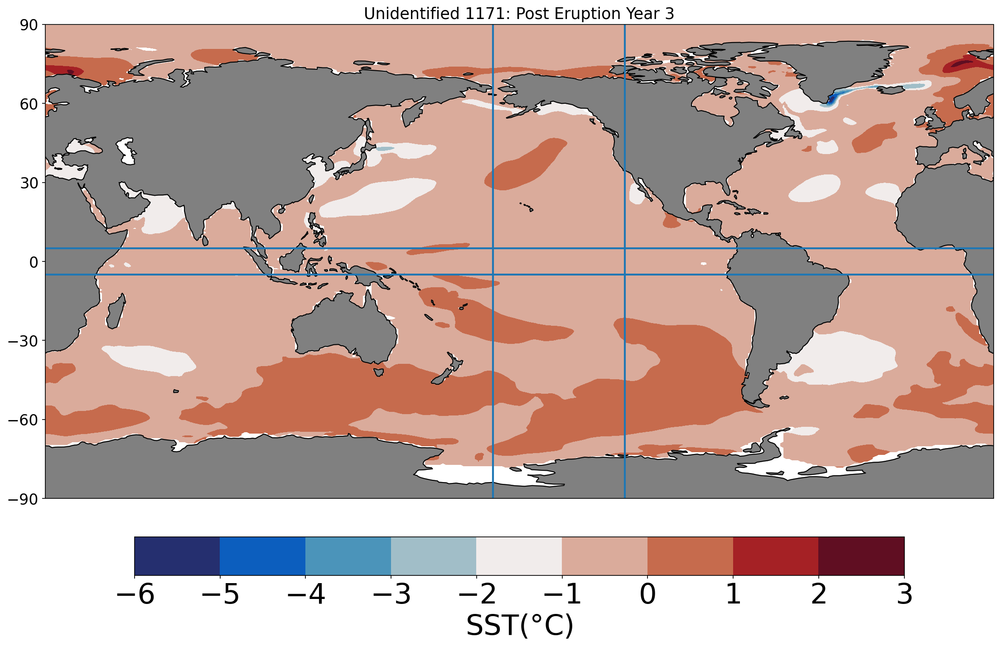

In [37]:
projection=ccrs.PlateCarree(central_longitude = -160)
fig,ax= plt.subplots(figsize =(18,15),subplot_kw=dict(projection=projection))

ax.add_feature(cfeature.LAND, color = 'gray')
ax.add_feature(cfeature.COASTLINE)
ax.set_global()


p = plt.contourf(new_lons,new_lats, plot_data,
                transform=ccrs.PlateCarree(),cmap= 'cmo.balance',zorder=-1) #'cmo.balance' or 'coolwarm'
ax.set_yticks([-90, -60, -30, 0, 30, 60, 90], crs=projection)
plt.axhline(y=5)
plt.axhline(y=-5)
plt.axvline(x=-10)
plt.axvline(x=40)
plt.title('Unidentified 1171: Post Eruption Year 3')
cbar = plt.colorbar(p, orientation='horizontal', pad=0.05, fraction=0.05,ax=ax)
cbar.ax.tick_params(labelsize=30)
cbar.set_label('SST' + "($\degree$C)", size = 30)